# Quantum Annealing

## Bibliografía

[Quantum Annealing para principiantes](https://medium.com/@anjanakrishnan3100/quantum-annealing-for-absolute-beginners-d38c51ac2b3f): Explica de forma resumida y sencilla cómo funciona

[Comparación entre Quantum Annealing y un ordenador cuántico al uso](https://www.youtube.com/watch?v=eFIk7wpU5vA&t=1s): No he incluido información de esta fuente en este cuaderno, pero lo que dice es muy interesante

[¿Qué es el Quantum Annealing?](https://www.youtube.com/watch?v=zvfkXjzzYOo): Explica en general qué es el algoritmo (pero no entra en detalle)

[¿Cómo funciona el Quantum Annealing?](https://www.youtube.com/watch?v=UV_RlCAc5Zs&t=2s): Explica más el proceso del Quantum Annealing (la mayoría de información teórica de este cuaderno viene de aquí)

[Physics of Quantum Annealing - Hamiltonian and Eigenspectrum](https://www.youtube.com/watch?v=tnikftltqE0): Explica lo del Hamiltoniano y el *Eigenspectrum*

[Problema del Reparto de Números](https://arxiv.org/pdf/cond-mat/0310317): Explicación del Problema del Reparto de Números

[Problema de las N-Reinas con Quantum Annealing](https://medium.com/@carlacarov/solving-the-n-queens-problem-with-quantum-annealing-b13ee199b210)

[Formulación QUBO para el Job Reassignment Problem](https://arxiv.org/pdf/2309.16473): Explicación del JRP, su formulación QUBO y pseudocódigo

In [1]:
# INDICAR SI ESTAMOS EN COLAB O NO (JUPYTER POR EJEMPLO)
colab = False

# SI ESTÁS EN COLAB -> CAMBIAR Y PONER TU RUTA DE DRIVE HASTA LA CARPETA DE TODOS LOS ARCHIVOS
ruta_base = '/content/drive/My Drive/Quantum/Annealing/'

In [2]:
if colab:
    from google.colab import drive
    drive.mount('/content/drive')
    subruta = 'Imágenes annealing/'

In [3]:
if colab:
    !pip install dimod
    !pip install dwave-neal
    !pip install dwave-networkx #Librerías para importar las herramientas del Quantum Annealing

In [4]:
import numpy as np # Para tratar vectores y matrices y operaciones matemáticas
from itertools import combinations, product # Para calcular combinaciones y productos de elementos de forma cómoda

from collections import defaultdict # Para importar un diccionario por defecto; se usa en 1.7

import dwave_networkx as dnx
import dimod
import neal
from dimod.reference.samplers import ExactSolver # Estas cuatro para el Quantum Annealing

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap # Para dibujar gráficas y los tableros de ajedrez

import networkx as nx # Grafos

import pandas as pd # Matrices

import random # Aleatoriedad

from IPython.display import display,Markdown,Latex,Image # Para Latex, enseñar imágenes, etc.

## Bibliografía

[Solving the n-queens problem with quantum annealing](https://medium.com/@carlacarov/solving-the-n-queens-problem-with-quantum-annealing-b13ee199b210)

[What is Quantum Annealing?](https://youtu.be/zvfkXjzzYOo)

[How The Quantum Annealing Process Works](https://youtu.be/UV_RlCAc5Zs)

[Physics of Quantum Annealing - Hamiltonian and Eigenspectrum](https://www.youtube.com/watch?v=tnikftltqE0)

## 0. Introducción

El **Quantum Annealing** es un algoritmo cuántico que difiere totalmente de otros algoritmos puramente cuánticos o híbridos (tales como los pertenecientes a la familia *VQA*), y el cual se puede aplicar a múltiples tipos de problemas de *optimización combinatoria* y de *muestreo de probabilidades*, aunque en este cuaderno nos centraremos en el primero tipo de problemas.

En el mundo clásico, el proceso de *Annealing* (en español se puede traducir como "recocer", "templar" o "atemperar", según el contexto) se refiere a cuando se calienta un metal a una temperatura específica (que depende del propio metal), para luego mantener la temperatura durante un periodo específico de tiempo y en último lugar enfriarlo. Este proceso cambia la disposición de los electrones, conllevando a una *configuración más estable* y obteniendo en consecuencia *propiedades mejoradas* como dureza, plasticidad, conductividad...

En resumen, hemos realizado una *transición gradual del estado de nuestro sistema* con el fin de lograr una configuración estable.

Por otro lado, tenemos un problema de *optimización binaria*, en el que existe un conjunto de *variables* $x_i \in \{0, 1\}$, una *función a minimizar* (si nuestra funcion es a maximizar, se cambia el signo de la función) y una serie de *restricciones*. La función a minimizar, que a partir de ahora denominaremos como **Hamiltoniano**, incluirá las restricciones existentes en forma de *penalización*. Además, la función objetivo habrá de tener la siguiente forma:

$$
min \ f(x_1,...,x_n) = \sum_i a_ix_i + \sum_i \sum_j x_ib_{ij}x_j
$$

Es decir, que sólo haya términos lineales y cuadráticos.

El concepto de *Annealing* se extiende a *Quantum Annealing* en el ámbito de la computación cuántica. En el *Quantum Annealing*, dado un problema de optimización, el *sistema cuántico* (los qubits) *evoluciona* con el tiempo a través de diversas operaciones cuánticas para alcanzar el *estado de energía más bajo* del hamiltoniano del qubit dentro de la *superficie de energía*.

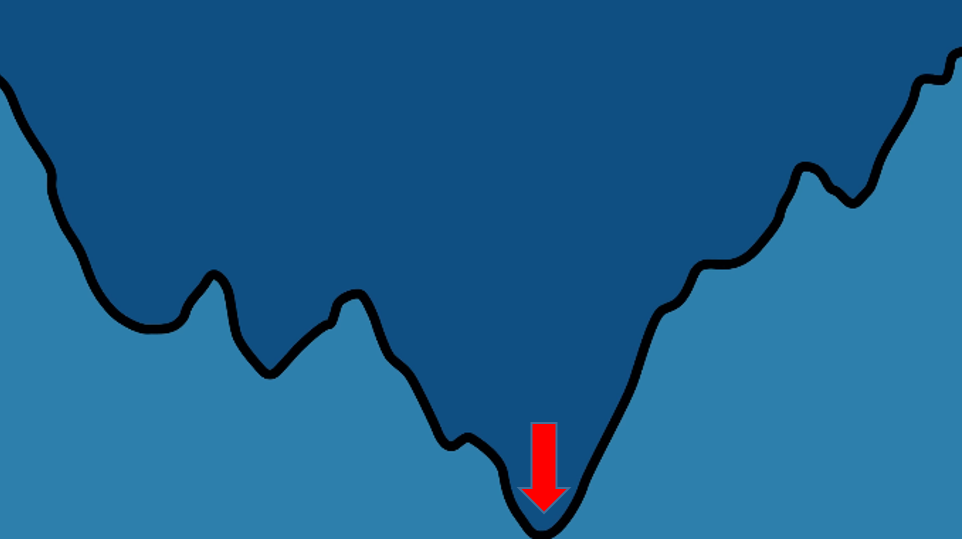

In [5]:
if colab:
    display(Image(filename = ruta_base + subruta + '11_energy.png'))
else:
    display(Image(filename='./Imágenes annealing/11_energy.png'))

Por otro lado, el *muestreo de probabilidades* está relacionados con los problemas de optimzación, pero son ligeramente diferentes. En vez de centrarse en encontrar el estado de mínima energía, lo que hace es obtener muestras de muchos estados de baja energía para así intentar definir la forma de la superficie de energía. Esto es muy útil en áreas como la Inteligencia Artificial, donde intentar construir una representación probabilística del mundo real (de un aspecto suyo). Estas muestras te dan información de cómo es tu modelo actualmente, y puedes usar las muestras para mejorarlo con el tiempo.

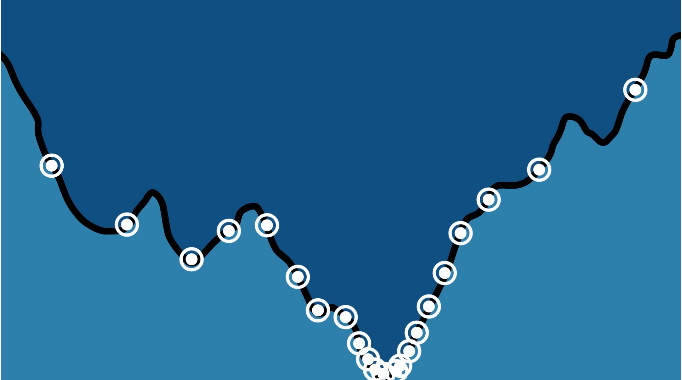

In [6]:
if colab:
    display(Image(filename = ruta_base + subruta + '12_dots.png'))
else:
    display(Image(filename='./Imágenes annealing/12_dots.png'))

¿Pero cómo funciona exactamente el *Quantum Annealing*? Vamos a considerar en primer lugar *un solo cúbit*, del cual pueden observarse *dos estados*: $0$ o $1$. Estos estados se codifican en *corrientes circulatorias en campos magnéticos* que giran en sentidos contrarios.

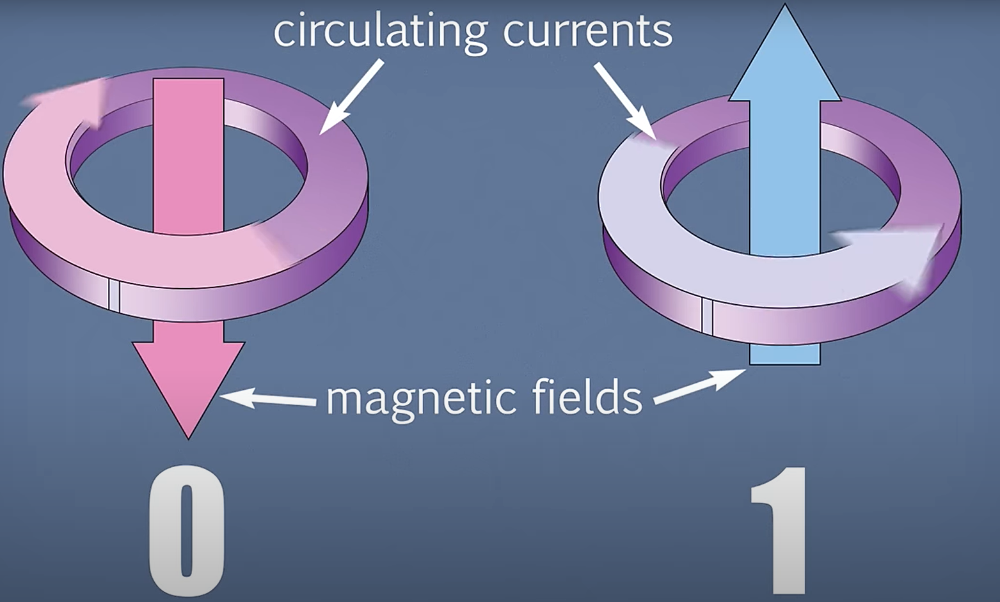

In [7]:
if colab:
    display(Image(filename = ruta_base + subruta + '1_Qubits.png'))
else:
    display(Image(filename='./Imágenes annealing/1_Qubits.png'))

Aunque tenemos que recordar que en el mundo cuántico un cúbit también puede estar en *superposición* de los estados $0$ y $1$.

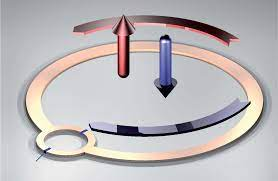

In [8]:
if colab:
    display(Image(filename = ruta_base + subruta + '2_superposición.png'))
else:
    display(Image(filename='./Imágenes annealing/2_superposición.png'))

Sin embargo, sabemos que al *observar* un cúbit, éste pasa de estar en superposición a estar en el estado $0$ o $1$. Esto es lo que hará el *Quantum Annealing:* hacer que el cúbit pase del estado de superposición al estado $0$ o $1$.

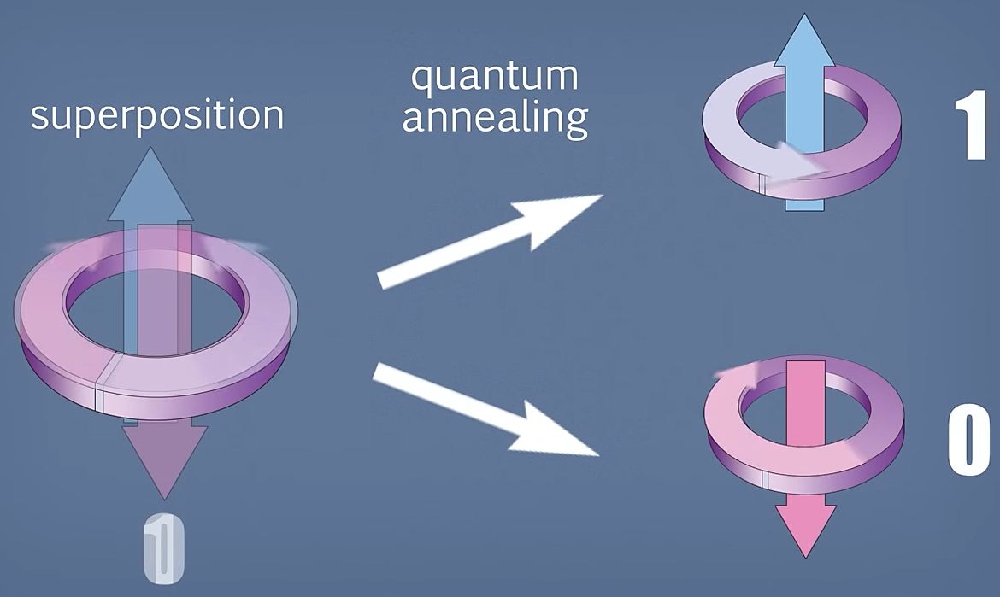

In [9]:
if colab:
    display(Image(filename = ruta_base + subruta + '2_bis_observar.png'))
else:
    display(Image(filename='./Imágenes annealing/2_bis_observar.png'))

Vamos a ver esto en un **diagrama de energía**. De forma normal, sin tener en cuenta el proceso de *Annealing*, el estado de *mínima energía* de un cúbit se alcanza cuando éste está en *superposición*.

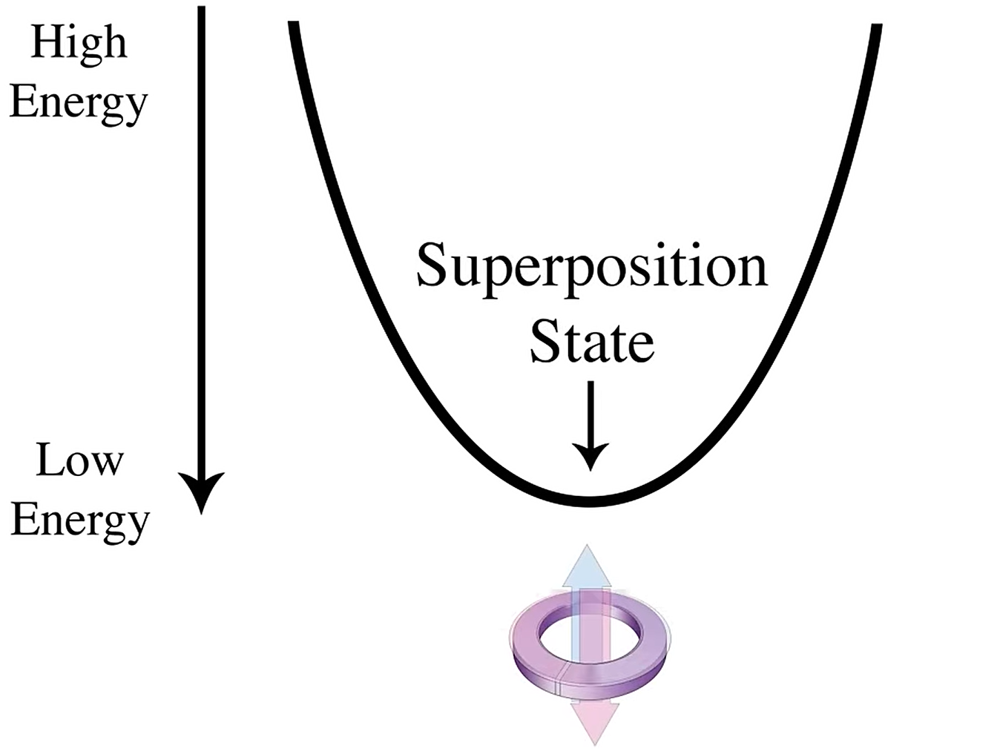

In [10]:
if colab:
    display(Image(filename = ruta_base + subruta + '3_minima_energia.png'))
else:
    display(Image(filename='./Imágenes annealing/3_minima_energia.png'))

Sin embargo, cuando se realiza el proceso de *Annealing*, se levanta una barrera, y la gráfica de energía se convierte en lo que se conoce como el *potencial de doble pozo*, en el que el punto más bajo del valle de la izquierda corresponde al estado $0$, y el de la derecha al estado $1$.

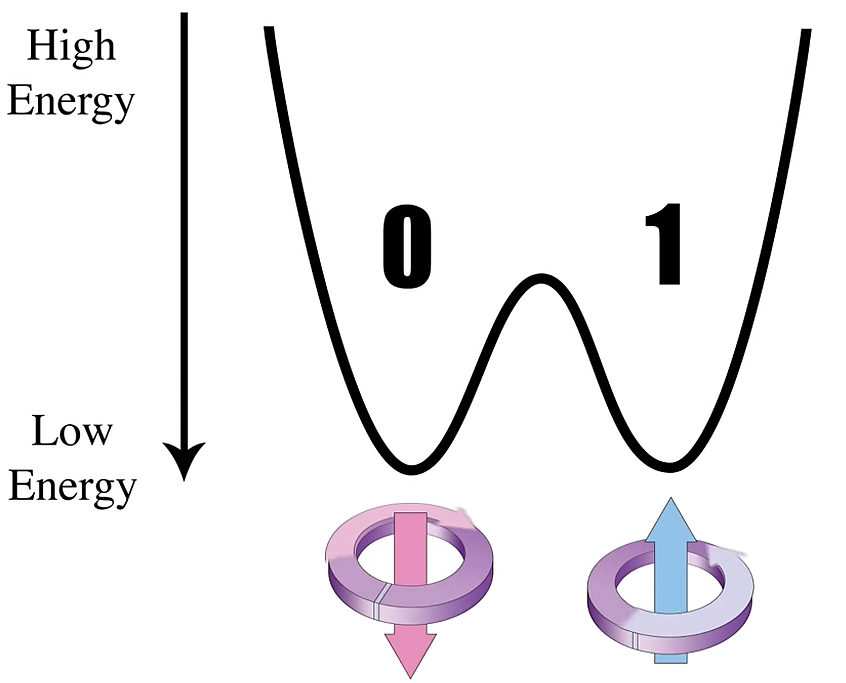

In [11]:
if colab:
    display(Image(filename = ruta_base + subruta + '4_valles.png'))
else:
    display(Image(filename='./Imágenes annealing/4_valles.png'))

El cúbit acabará en uno de estos dos valles al final del proceso, pero ¿cómo decide en cuál acabar? Tal y como están las cosas ahora, el cúbit tiene un $50$% de probabilidades de acabar en cada estado. No obstante, se puede *controlar la probabilidad* de que el cúbit acabe en uno u otro estado, lo cual se consigue **aplicando un campo magnético externo al cúbit**, llamado **bias**. Esto se hace para *inclinar el potencial* de doble pozo, *aumentando la probabilidad* de acabar en el *estado del pozo más bajo*. Entonces, ¡lo que hace el bias es **minimizar la energía del cúbit**!

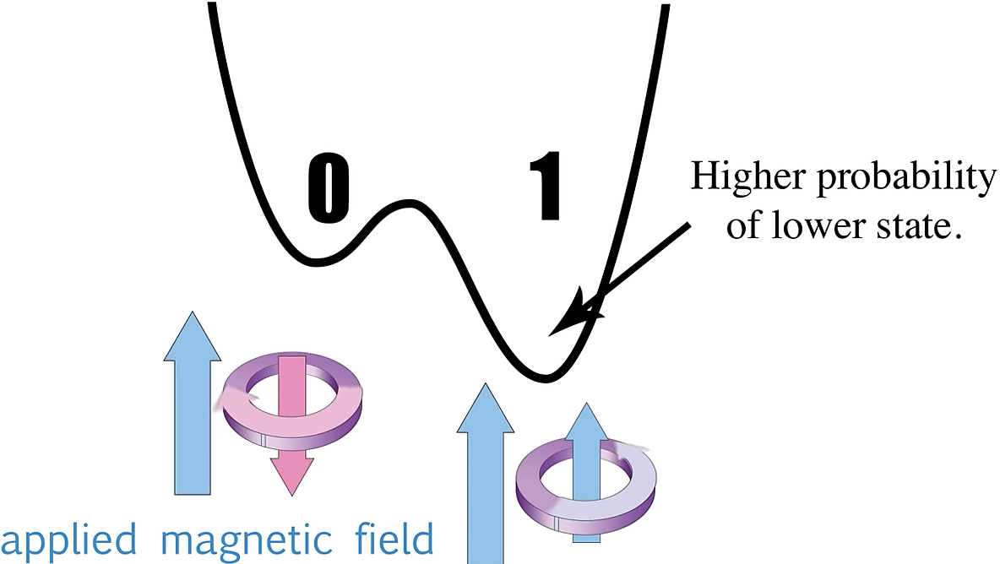

In [12]:
if colab:
    display(Image(filename = ruta_base + subruta + '5_bias.png'))
else:
    display(Image(filename='./Imágenes annealing/5_bias.png'))

El hecho de poder controlar si el cúbit "caerá en el pozo" de un estado u otro es realmente útil, pero el verdadero poder de este algoritmo viene dado por la posibilidad de *conectar varios cubits entre sí* para que se influyan entre ellos. Esto se hace con un dispositivo llamado **acoplador**.

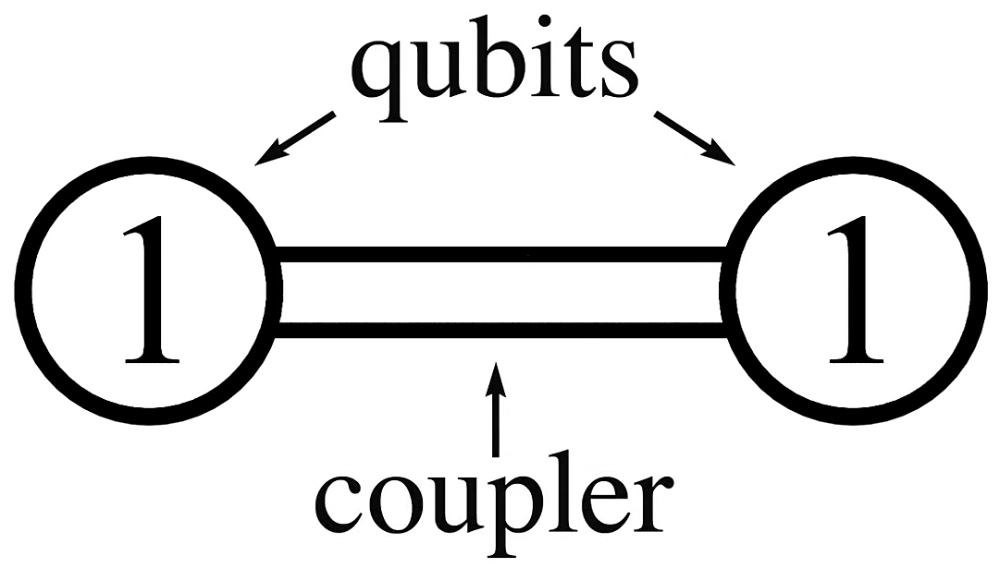

In [13]:
if colab:
    display(Image(filename = ruta_base + subruta + '6_coupler.png'))
else:
    display(Image(filename='./Imágenes annealing/6_coupler.png'))

Básicamente, lo que hace un acoplador es *ligar dos cúbits* para que *compartan un mismo destino*. Pero distinguimos **dos tipos** de acopladores: el primero hace que ambos cúbits terminen en el *mismo estado* (sean los dos cúbits $0$ o $1$), mientras que el segundo hace que terminen en *estados opuestos* (uno acaba en $0$ y el otro en $1$).

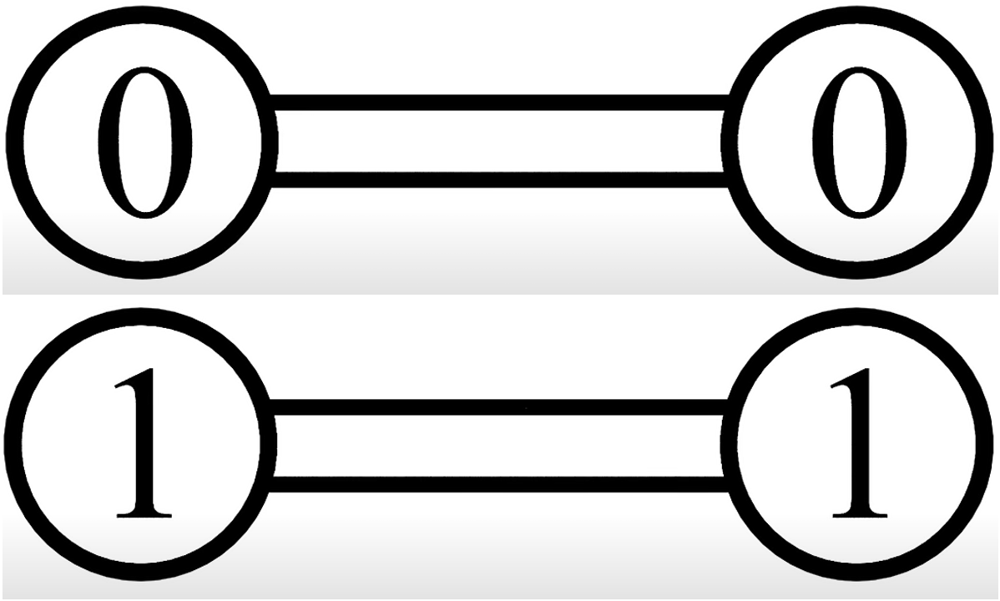

In [14]:
if colab:
    display(Image(filename = ruta_base + subruta + '7_mismo.png'))
else:
    display(Image(filename='./Imágenes annealing/7_mismo.png'))

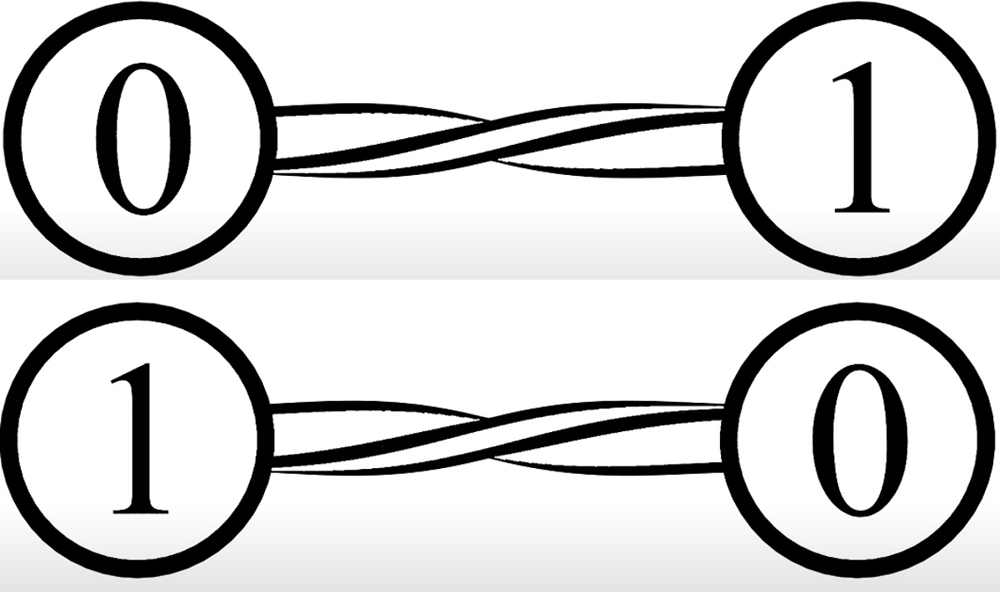

In [15]:
if colab:
    display(Image(filename = ruta_base + subruta + '7_bis_opuestos.png'))
else:
    display(Image(filename='./Imágenes annealing/7_bis_opuestos.png'))

Cuando hay un acoplador entre dos cúbits, se experimenta lo que se conoce en física cuántica como **entrelazamiento**. Cuando dos cubits están entrelazados, han de tratarse como un único objeto cuántico, pero ahora se pueden alcanzar 4 estados diferentes ($00, 01, 10,$ y $11$).

Ahora imagina el potencial de estos dos cubits en los respectivos pozos, cada uno representando una posible combinación de estos dos cubits. Las energías relativas dependen de los diferentes **biases** aplicados a los cubits entrelazados.

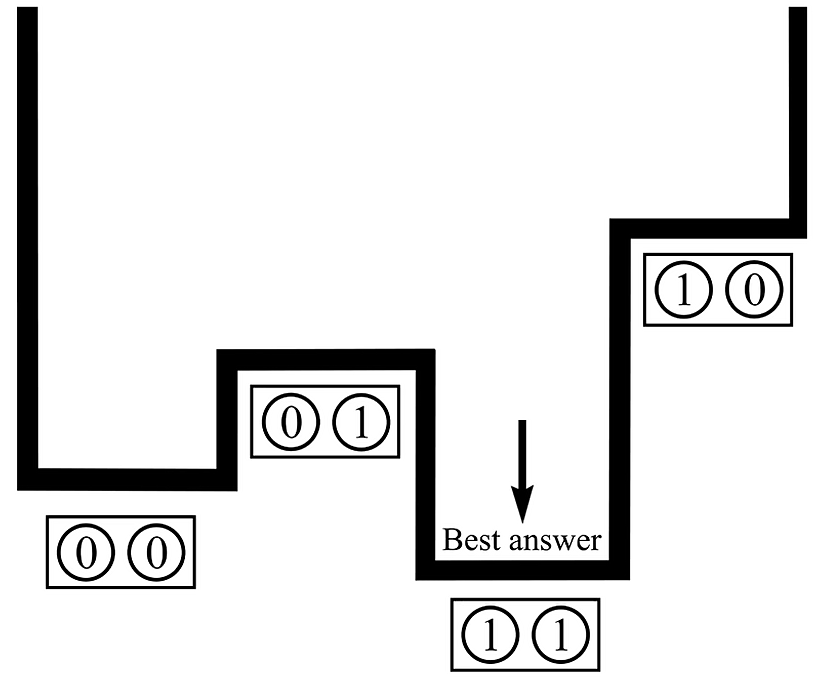

In [16]:
if colab:
    display(Image(filename = ruta_base + subruta + '8_4_pozos.png'))
else:
    display(Image(filename='./Imágenes annealing/8_4_pozos.png'))

Antes se ha dicho que según el tipo de acoplador que consideremos, los cúbits acabarán de una u otra forma, ¿no? En realidad lo que ocurre es que los acopladores hacen que *esos estados tengan menos energía* en comparación con los otros (que es lo que queremos). La *primera imagen* corresponde a un acoplador que hace más probable que los dos cubits acaben con el *mismo estado*, y la *segunda imagen* corresponde al acoplador que hace más probable que acaben con *estados contrarios*.

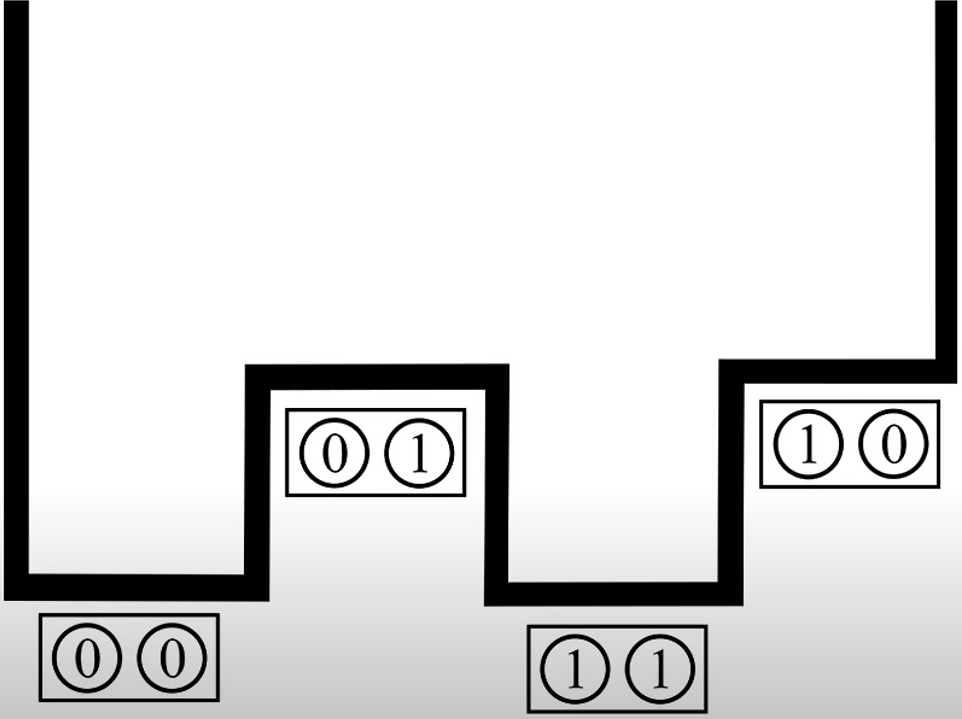

In [17]:
if colab:
    display(Image(filename = ruta_base + subruta + '9_pozos_mismo.png'))
else:
    display(Image(filename='./Imágenes annealing/9_pozos_mismo.png'))

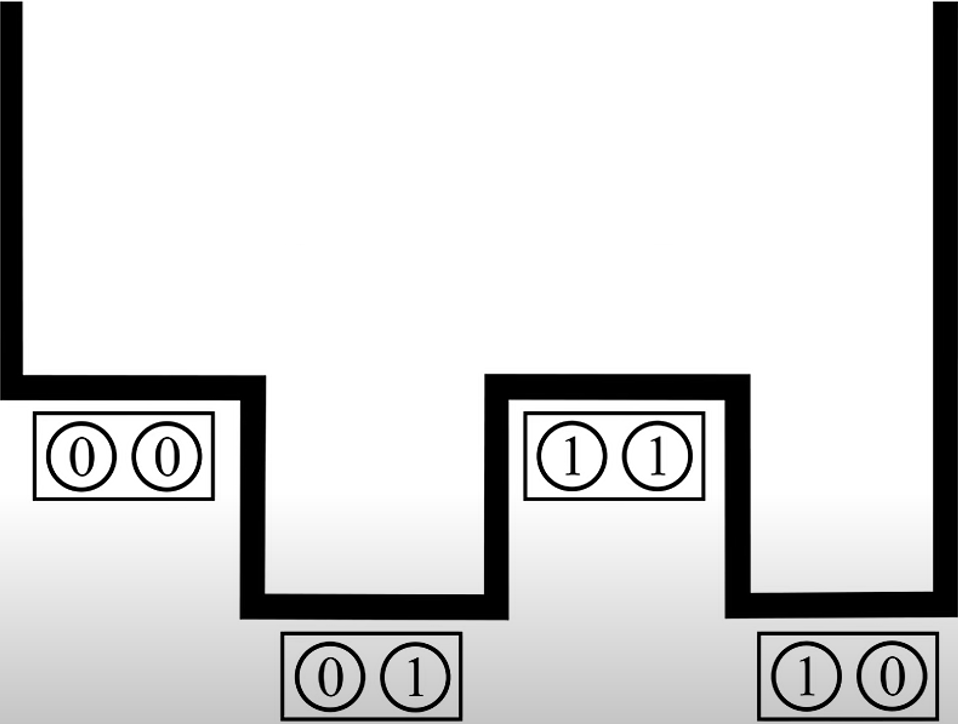

In [18]:
if colab:
    display(Image(filename = ruta_base + subruta + '9_pozos_opuesto.png'))
else:
    display(Image(filename='./Imágenes annealing/9_pozos_opuesto.png'))

Cada cúbit puede tener un bias aplicado a él, y los cubits pueden interactuar gracias a los acopladores. Y lo más interesante es que puedes *escoger* tú mismo los *biases* y los *acopladores* tú mismo, tanto su dirección como su fuerza. Ese conjunto de biases y acopladores que escojas con sus respectivas propiedades, crean lo que hemos introducido antes como **superficie de energía potencial**. Luego, el *Quantum Annealing* encuentra el punto con la energía más baja. Y las posibilidades son muy grandes, porque el número de posibles estados es $2^n$, siendo $n$ el número de cúbits.

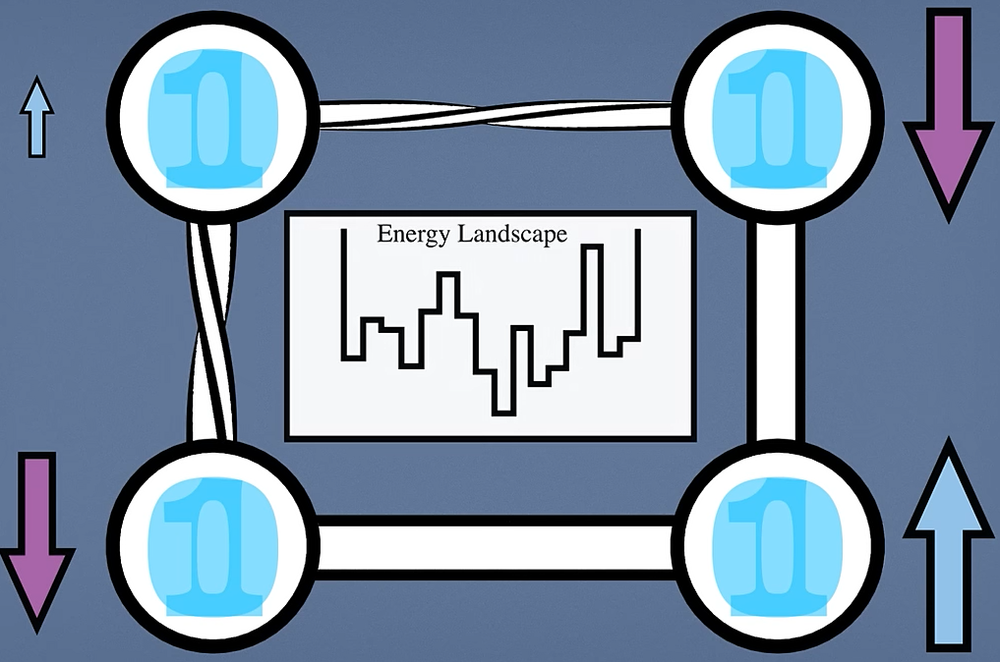

In [19]:
if colab:
    display(Image(filename = ruta_base + subruta + '10_mapa.png'))
else:
    display(Image(filename='./Imágenes annealing/10_mapa.png'))

En resumen, al principio contamos con un conjunto de cubits no conectados entre sí y cada uno en superposición. Luego ejecutamos el *Quantum Annealing*, donde introducimos los *biases* y los *acopladores*. Entonces este enorme objeto cuántico cambia la probabilidad de cada cúbit en acabar en uno u otro estado. Al final, cada cúbit acaba como $0$ o $1$, y este estado final es el de mínima energía.

### 0.1 Hamiltoniano

Un apunte sobre el Hamiltoniano. Aunque ya sepamos su forma, vamos a explicar con todo lo que ya sabemos cómo actúa sobre los cubits.

Hemos dicho que queremos alcanzar el punto con la mínima energía posible. Y hasta ahora hemos dicho que ésta depende de nuestro Hamiltoniano, que es verdad... Hasta cierto punto.

En realidad, la fórmula de la energía del sistema es

$$
H_s(s) = -\frac{1}{2} \sum_i Δ(s)\sigma_i^x + ϵ(s) \bigg( -\sum_i a_ix_i + \sum_i \sum_j x_ib_{ij}x_j \bigg)
$$

Donde el primer término es el **Hamiltoniano inicial**, y es el estado de mínima energía para un **conjunto de cúbits en superposición**, y la segunda parte es el **Hamiltoniano final** o **de nuestro problema**, y cuya solución óptima da lugar al estado de mínima energía. Los acopladores y los biases están relacionados con este Hamiltoniano.

Al principio del Quantum Annealing tenemos el sistema representado por el Hamiltoniano inicial $\bigg(H_s(s) = -\frac{1}{2} \sum_i Δ(s)\sigma_i^x \bigg)$, con todos los cubits sin relacionarse entre sí y en superposición (estado de mínima energía).

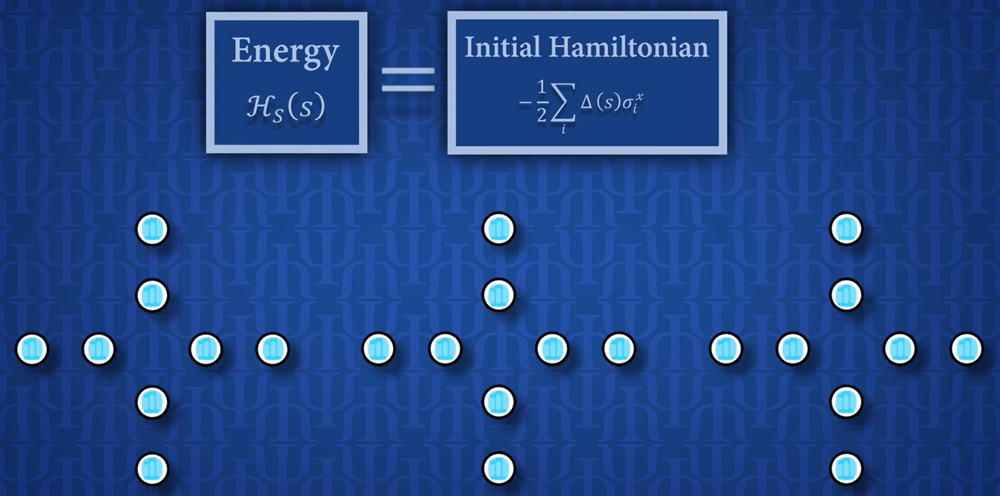

In [20]:
if colab:
    display(Image(filename = ruta_base + subruta + '13_inicio.png'))
else:
    display(Image(filename='./Imágenes annealing/13_inicio.png'))

A medida que avanza el algoritmo, el Hamiltoniano final se va haciendo más y más importante (también aparecen los biases y acopladores), y el Hamiltoniano inicial más y más pequeño, pasando de un sistema cuántico a uno clásico.

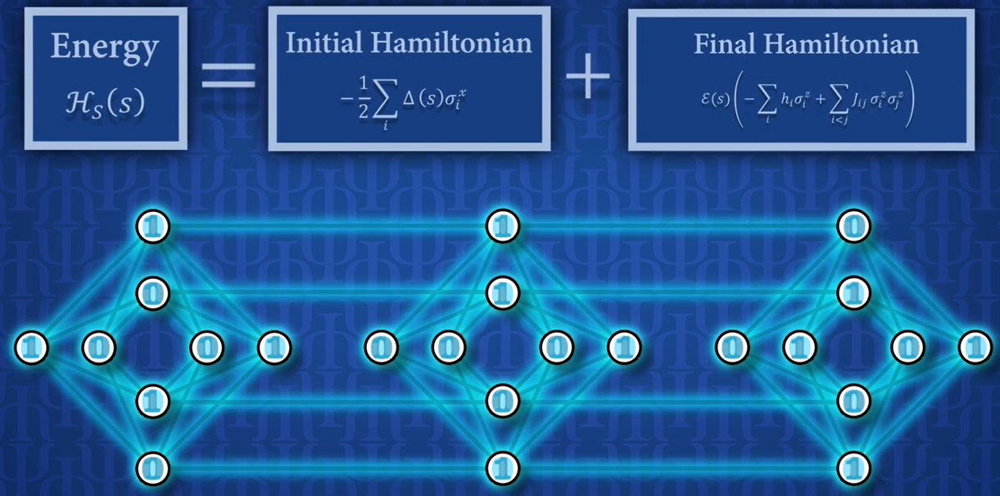

In [21]:
if colab:
    display(Image(filename = ruta_base + subruta + '13_intermedio.png'))
else:
    display(Image(filename='./Imágenes annealing/13_intermedio.png'))

Al final del algoritmo, obtendremos un sistema clásico correspondiente al estado de mínima energía del Hamiltoniano final, y si hemos hecho las cosas bien, ésta será la solución óptima a nuestro problema.

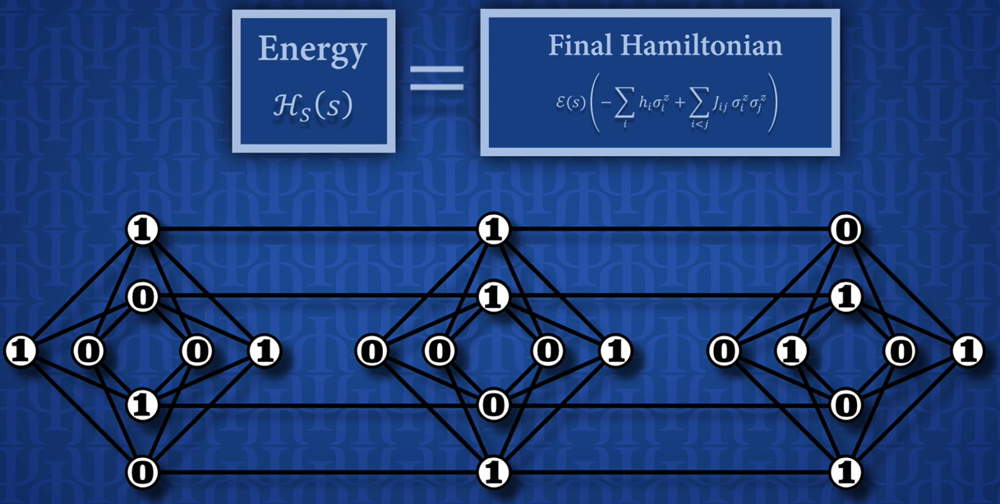

In [22]:
if colab:
    display(Image(filename = ruta_base + subruta + '13_final.png'))
else:
    display(Image(filename='./Imágenes annealing/13_final.png'))

### 0.2 El *eigenspectrum*

Con todo lo visto hasta ahora, puede que una duda que haya surgido sea si siempre llegaremos a la solución óptima tras ejectutar el algoritmo una sola vez, y la respuesta es *depende*. En concreto, depende de la dificultad del problema y de cómo lo codifiquemos (esto último se explica después). Sin embargo, una forma de visualizar los posibles estados de energía en los que podemos estar durante el proceso de Annealing es con un *eigenspectrum*.

El *eigenspectrum* es una gráfica en donde el eje horizontal es el tiempo (el origen es el principio del algoritmo, y la parte derecha es el final del algoritmo), y el vertical la energía de un estado. El estado de mínima energía está en la parte inferior del gráfico, y el resto de estados (que están más excitados por tener más energía) están por encima suya.

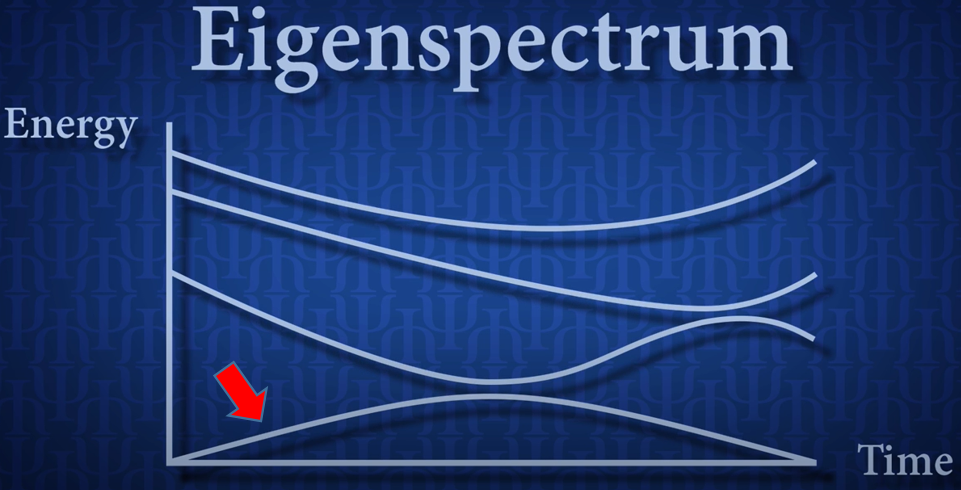

In [23]:
if colab:
    display(Image(filename = ruta_base + subruta + '14_eigen.png'))
else:
    display(Image(filename='./Imágenes annealing/14_eigen.png'))

El sistema empieza en el estado de mínima energía del Hamiltoniano inicial, es decir, con todos los cubits en superposición (en la curva de abajo a la izquierda, en el origen). Esta energía estará bastante separada de los otros niveles de energía. A medida que avanza el algoritmo, se va introduciendo el Hamiltoniano final (de nuestro problema), hay niveles de energía que se van acercando poco a poco a nuestro estado de mínima energía. Cuánto más se acerquen, más probabilidades de que el sistema salte del estado de mínima energía a uno con más energía (más excitado).  

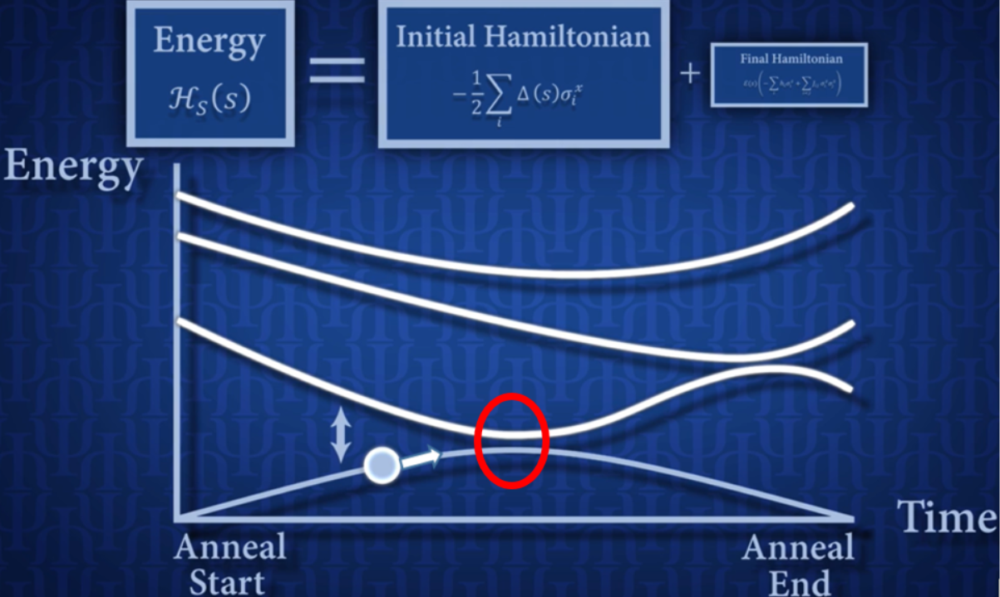

In [24]:
if colab:
    display(Image(filename = ruta_base + subruta + '15_avance.png'))
else:
    display(Image(filename='./Imágenes annealing/15_avance.png'))

Hay un punto en el que el estado de mínima energía está lo más cerca posible a un estado más excitado, pero después empiezan a divergir y el estado de mínima energía va adquiriendo niveles menores y menores de energía. Esto se conoce como el **gap mínimo** o **anticrossing**.

Existen varios mecanismos por los que el sistema puede saltar del estado de mínima energía a uno de mayor energía. Una puede ser por la energía por fluctuaciones térmicas que pueden afectar a cualquier sistema físico (es como si el círculo que representa nuestro sistema estuviera vibrando y en el mínimum gap salta a la curva superior). Y la otra forma es comunicarle mucha velocidad a nuestro sistema, lo cual se traduce en mucha energía, lo que puede conllevar a que el sistema de nuevo salte.

El proceso de comunicarle poca energía a nuestro sistema para que siempre permanezca en el estado de mínima energía se denomina **adiabático**. En realidad, en problemas muy grandes, las probabilidades de permanecer en el estado de mínima energía son bajas, pero la mayoría de veces acabaremos en un estado con muy baja energía (una buena solución).

Y aunque igual no puedas dibujar en este cuaderno el *eigenspectrum* de un problema, si te interesa cómo en el mundo real se consigue, puedes mirar este vídeo: [Measuring Quantum Physics in a Quantum Annealer](https://www.youtube.com/watch?v=kq9VqR0ZGNc)

## 1. Resolución de problemas

A continuación, vamos a ver la aplicación de este algoritmo en distintos problemas. Pero basicamente lo que tenemos que hacer en cada problema es, dada nuestra función a minimizar: $\sum_i a_ix_i + \sum_i \sum_j x_ib_{ij}x_j$, calcular todos los coeficientes $a_i, b_{ij}$ y separarlos en dos diccionarios, el primero de la forma $\{i:a_i\}$ y el segundo de la forma $\{ (i,j): b_{ij} \}$. Además, podemos expresar el problema tanto en variables binarias $x_i \in \{0, 1\}$, como en variables **Ising** $z_i \in \{1, -1\}$. Posteriormente se enseñará un ejemplo con éste último tipo.  

Un último apunte. Si estamos considerando las variables binarias $x_i \in \{0, 1\}$, entonces $x_i^2 = x_i$, y si estamos usando las variables Ising $z_i \in \{1, -1\}$, entonces $z_i^2 = 1$.

### 1.1 Implementación con ejemplo Ket-G

El primer problema consiste en minimizar la función $f(x_0,x_1,x_2) = 2x_0-4x_0x_1+3x_1x_2$, donde $x_i \in \{0,1\}$. Su mínimo es cuando $x_0 = 1, x_1 = 1, x_2 = 0$, con $f(1,1,0) = -2$.

En este caso, el diccionario de los coeficientes lineales es `{0: 2}` porque el único término lineal que tiene coeficiente es $x_0$. Por otro lado, el diccionario de los términos cuadráticos es `{(0, 1): -4, (1, 2): 3}`.

También vamos a definir una función que nos calcule el valor de la función objetivo para una solución concreta.

In [25]:
# Función para calcular el valor de una solución en la función objetivo
def function(muestra):
    x0 = muestra[0]
    x1 = muestra[1]
    x2 = muestra[2]
    return 2*x0 - 4*x0*x1 + 3*x1*x2

def coefficients():
    linear = {0: 2}
    quadratic = {(0, 1): -4, (1, 2): 3}
    return linear, quadratic

linear, quadratic = coefficients()

Ahora definimos el *Quantum Annealing*. Las funciones importantes son:

- `dimod.BinaryQuadraticModel(linear, quadratic, offset, vartype)`: para representar modelos cuadráticos binarios, el tipo de problemas que resuelve nuestro algoritmo. Los parámetros que hay que considerar son:
  - `linear, quadratic`: Los diccionarios con los coeficientes lineales y cuadráticos respectivamente
  - `offset`: Término constante que se suma al valor total del modelo. Normalmente se pone cero.
  -`vartype`: Ponemos `'BINARY'` si nuestras variables son $x_i \in \{0, 1 \}$, y `'SPIN'` si son $z_i \in \{1, -1 \}$.
- `neal.SimulatedAnnealingSampler().sample(bqm, num_reads, beta_range, num_sweeps, seed)` es una implementación clásica (no cuántica) del *Simulated Annealing*
  - `neal.SimulatedAnnealingSampler()`: Crea un muestreador que puede resolver un modelo cuadrático binario
  - `.sampler(bqm, num_reads, beta_range, num_sweeps, seed)` ejecuta el muestreo.
    - `bqm`: Nuestro objeto de `Binary Quadratic Model`.
    - `num_reads`: número de veces que se ejecuta el algoritmo (más lecturas → más diversidad y calidad de soluciones)
    - `beta_range`: Tupla `(beta_min, beta_max)` que representa el rango de temperatura inversa durante el proceso de enfriamiento.
      - $\beta = \frac{1}{kT}$ → a mayor $\beta$, menor temperatura (más "estricto")
      - Se comienza en `beta_min` (alta temperatura) → se permite explorar y aceptar soluciones peores.
      - Se termina en `beta_max` (baja temperatura) → se estabiliza en mínimos energéticos.
    - `num_sweeps`: Número de actualizaciones del estado del sistema por ejecución (un sweep significa intentar actualizar el valor de cada variable del problema una vez). Más "sweeps" supone una búsqueda más profunda (pero más lenta).

  Devuelve un objeto `SampleSet` con las soluciones encontradas por el sampler. Puedes acceder a:
    - Soluciones: `sampleset.samples()`. Devuelve un `SampleArray`, que es una especie de array pero como un iterador, en el que cada fila es una solución de la forma `variable: 0/1`.
    - Energías asociadas a las muestras: con el atributo `data_vectors['energy']` o `record.energy`
    - Número de ocurrencias de cada resultado: con el atributo `.data_vectors['num_occurrences']` o `record.num_occurrences` (esto probablemente no lo uséis, pero por si os saliese un error relacionado con esto, para que sepáis que existe)

In [26]:
# Función que implementa el Quantum Annealing
def quantum_annealing(linear, quadratic):
    # Modelo cuadrático
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0, 'BINARY')

    # Simulated Annealing
    sampler = neal.SimulatedAnnealingSampler()
    sampleset = sampler.sample(bqm, num_reads=10)

    # Objeto con energías
    energias = sampleset.data_vectors['energy'] # Equivalente a sampleset.record.energy

    # Objeto con muestras
    muestras = sampleset.samples()

    # Lista para guardar resultados de muestras
    results = []

    # En este caso, la energía y el valor de la función objetivo coinciden, pero igual nos interesa en un problema con penalizaciones
    ## por restricciones mostrar sólo el valor de la función objetivo.
    for i in range(len(muestras)):
        results.append((muestras[i], energias[i], function(muestras[i])))
        print(f"Sample: {muestras[i]}, energía: {energias[i]}, valor: {function(muestras[i])}")

    # Ordenar por valor de la función objetivo
    results.sort(key=lambda x: x[1])

    # Mostrar mejor solución
    best = results[0]
    print("\n🟢 Mejor solución:")
    print(f"Sample: {best[0]}, valor: {best[2]}")

quantum_annealing(linear, quadratic)

Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2
Sample: {0: 1, 1: 1, 2: 0}, energía: -2.0, valor: -2

🟢 Mejor solución:
Sample: {0: 1, 1: 1, 2: 0}, valor: -2


### 1.2 Implementación del problema de Ket-G con restricciones

Ahora vamos a introducir unas restricciones:

$$
x_0+x_1-x_2 = 0
$$

$$
x_0+2x_1-x_2 ≤ 1
$$

Entonces la función objetivo ahora es

$$
min \ f(x_0,x_1,x_2) = 2x_0-4x_0x_1+3x_1x_2 + \lambda_1(x_0+x_1-x_2)^2 + \lambda_2(x_0+2x_1-x_2 - 1)^2
$$

Siendo la solución óptima $x_0 = x_1 = x_2 = 0$ con $f(x_0,x_1,x_2) = 0$.

Desarrollamos la primera restricción:

$$
\lambda_1(x_0+x_1-x_2)^2 = \lambda_1 (x_0x_0+2x_0x_1-2x_0x_2+x_1x_1-2x_1x_2+x_2x_2)
$$

Desarrollamos la segunda restricción:

$$
\lambda_2(x_0+2x_1-x_2 - 1)^2 = \lambda_2 (x_0x_0+4x_0x_1-2x_0x_2-2x_0+4x_1x_1-4x_1x_2-4x_1+x_2x_2+2x_2+1)
$$

Juntando todo tenemos:
$$
min \ f(x_0,x_1,x_2) = 2x_0-4x_0x_1+3x_1x_2 +  \lambda_1 (x_0x_0+2x_0x_1-2x_0x_2+x_1x_1-2x_1x_2+x_2x_2) + \lambda_2 (x_0x_0+4x_0x_1-2x_0x_2-2x_0+4x_1x_1-4x_1x_2-4x_1+x_2x_2+2x_2+1)
$$

Los coeficientes lineales son:

$$
(2-2\lambda_2)x_0-4\lambda_2 · x_1 + 2\lambda_2 · x_2
$$

Y los cuadráticos:
$$
(\lambda_1+\lambda_2)x_0^2 + (-4+2\lambda_1+4\lambda_2)x_0x_1 + (-2\lambda_1-2\lambda_2)x_0x_2 + (\lambda_1+4\lambda_2)x_1^2 + (3-2\lambda_1-4\lambda_2)x_1x_2+(\lambda_1\lambda_2)x_2^2
$$

Pero claro, en realidad, como $x_i^2 = x_i$, los términos de $x_0^2, x_1^2$ y $x_2^2$ son de $x_0,x_1,x_2$. Entonces los términos lineales son:

$$
x_0 \rightarrow 2+\lambda_1-\lambda_2 \\
x_1 \rightarrow \lambda_1 \\
x_2 \rightarrow 2\lambda_2 + \lambda_1\lambda_2
$$

y los cuadráticos

$$
x_0x_1 → -4+2\lambda_1+4\lambda_2 \\
x_0x_2 → -2\lambda_1-2\lambda_2 \\
x_1x_2 → 3-2\lambda_1-4\lambda_2
$$

In [27]:
def function(muestra):
    x0 = muestra[0]
    x1 = muestra[1]
    x2 = muestra[2]
    return 2*x0 - 4*x0*x1 + 3*x1*x2

def coefficients(lambda1, lambda2):
    linear = {0: (2+lambda1-lambda2), 1: lambda1, 2: 2*lambda2 + lambda1*lambda2}
    quadratic = {(0, 1): -4+2*lambda1+4*lambda2, (0, 2): -2*lambda1-2*lambda2, (1, 2): 3-2*lambda1-4*lambda2}
    return linear, quadratic

def quantum_annealing(linear, quadratic):
    # Modelo cuadrático
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0, 'BINARY')

    # Simulated Annealing
    sampler = neal.SimulatedAnnealingSampler()
    sampleset = sampler.sample(bqm, num_reads=10)

    # Objeto con energías
    energias = sampleset.data_vectors['energy'] # Equivalente a sampleset.record.energy

    # Objeto con muestras
    muestras = sampleset.samples()

    # Lista para guardar resultados de muestras
    results = []

    # En este caso, la energía y el valor de la función objetivo coinciden, pero igual nos interesa en un problema con penalizaciones
    ## por restricciones mostrar sólo el valor de la función objetivo.
    for i in range(len(muestras)):
        results.append((muestras[i], energias[i], function(muestras[i])))
        print(f"Sample: {muestras[i]}, energía: {energias[i]}, valor: {function(muestras[i])}")

    # Ordenar por valor de la función objetivo
    results.sort(key=lambda x: x[1])

    # Mostrar mejor solución
    best = results[0]
    print("\n🟢 Mejor solución:")
    print(f"Sample: {best[0]}, valor: {best[2]}")

# Instance an object of the class
lambda1 = 2
lambda2 = 2
linear, quadratic = coefficients(lambda1, lambda2)
quantum_annealing(linear, quadratic)

Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0
Sample: {0: 0, 1: 0, 2: 0}, energía: 0.0, valor: 0

🟢 Mejor solución:
Sample: {0: 0, 1: 0, 2: 0}, valor: 0


### 1.3 Implementación del problema del Reparto de Números

Vamos ahora con otro problema que es sencillo de entender pero más complicado de solucionar al menos a mano (de hecho, es un problema NP, es decir, no resoluble en tiempo polinomial).

Imagina que tienes una serie de objetos $L$ con valores $v_1,...,v_k, v_i \in \mathbb{R}^+$. Tu objetivo es distribuir los objetos en dos subconjuntos de forma que estén lo más equilibrados posibles (según sus valores).

Con pocos objetos este problema es trivial, pero a medida que ponemos más y más objetos, ¡este problema se vuelve muy complicado de solucionar! Vamos a ver cómo solucinarlo de forma cuántica.

Hay que definir la función a optimizar y el correspondiente Hamiltoniano. Podemos escribir la siguiente función:

$$
min \bigg( \sum_{i=1}^k z_iv_i \bigg)^2
$$

donde $z_i=1$ si el objeto $i$ va al subconjunto $L_1$ y $z_i=-1$ si va al subconjunto $L_2$.

Vamos a solucionar el problema de dos formas. La primera pasando a las variables binarias tradicionales $x_i \in \{0,1\}$ y la segunda manteniendo las variables $z_i \in \{1, -1\}$ (en formato Ising)

¿Y cómo sabemos que esta fórmula nos sirve para nuestro propósito? Desarrollando el término a la izquierda de la igualdad:

$$
min \bigg( \sum_{i=1}^k z_iv_i \bigg)^2 = min \bigg( \sum_{i \in L_1}^k v_i - \sum_{i \in L_2}^k v_i \bigg)^2
$$

Esto será mínimo cuánto más iguales sean los grupos.

#### 1ª Forma: Variables $x_i$

En los algoritmos de la familia VQA (*Variational Quantum Algorithms*, se hacia la transformación a modelo Ising (y se convertían después directamente a puertas de Pauli Z):

$$
x_i = \frac{1-z_i}{2}
$$

Pero ahora tenemos el caso inverso: tenemos que pasar de valores $z_i$ a valores $x_i$. Por ello, la transformación que haremos es:

$$
z_i = 1-2x_i
$$

Sustituimos en la fórmula:

$$
\bigg( \sum_{i=1}^k (1-2x_i)v_i \bigg)^2 = \bigg( \sum_{i=1}^k v_i -2 \sum_{i=1}^k v_i x_i \bigg)^2
$$

La suma de los valores $\sum v_i$ la denotaremos como $C$, una constante. Entonces tenemos

$$
\bigg( C -2 \sum_{i=1}^k v_i x_i \bigg)^2
$$

Desarrollamos el cuadrado

$$
= C^2-4C\sum x_iv_i +4\bigg(\sum x_iv_i\bigg)^2
$$

Desarrollamos el último término (y tenemos en cuenta que $x_i^2 = x_i$ por ser variables binarias)

$$
\bigg(\sum x_iv_i\bigg)^2 = \sum x_i^2v_i^2 + \sum_{i<j} 2x_ix_jv_iv_j = \sum x_iv_i^2 + \sum_{i<j} 2x_ix_jv_iv_j
$$

Por lo que la fórmula entera es (no olvidamos el coeficiente 4 e ignoramos la constante al cuadrado):

$$
-4C\sum x_iv_i+4\sum x_iv_i^2 +8\sum_{i<j} x_ix_jv_iv_j \rightarrow \sum (4v_i^2-4Cv_i)x_i + 8\sum_{i<j} v_iv_jx_ix_j
$$

In [28]:
def function(sample, v):
    suma = sum(int(sample[i]) * int(v[i]) for i in range(len(v)))
    return abs(sum(v) - 2 * suma)

def coefficients(v):

    n = len(v)
    C = sum(v)

    linear = {}
    quadratic = {}

    for i in range(n):
        # coeficiente de x_i: -4C*v_i + 4*v_i^2
        linear[i] = -4 * C * v[i] + 4 * v[i]**2

    for i in range(n):
        for j in range(i+1, n):
            # coeficiente de x_i x_j: 8 * v_i * v_j
            quadratic[(i, j)] = 8 * v[i] * v[j]

    return linear, quadratic


def quantum_annealing(linear, quadratic, v, num_iter):
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0.0, dimod.BINARY)
    sampler = neal.SimulatedAnnealingSampler()
    sampleset = sampler.sample(bqm,
                              num_reads=num_iter,
                              beta_range=[0.1, 4.0],
                              num_sweeps=1000)

    # Objeto con energías
    energias = sampleset.data_vectors['energy'] # Equivalente a sampleset.record.energy

    # Objeto con muestras
    muestras = sampleset.samples()

    # Lista para guardar resultados de muestras
    results = []

    # En este caso, la energía y el valor de la función objetivo coinciden, pero igual nos interesa en un problema con penalizaciones
    ## por restricciones mostrar sólo el valor de la función objetivo.
    for i in range(len(muestras)):
        results.append((muestras[i], energias[i], function(muestras[i], v)))
        print(f"Sample: {muestras[i]}, energía: {energias[i]}, valor: {function(muestras[i], v)}")

    # Ordenar por valor de la función objetivo
    results.sort(key=lambda x: x[1])

    # Mostrar mejor solución
    best = results[0]
    print("\n🟢 Mejor solución:")
    print(f"Sample: {best[0]}, valor: {best[2]}")

# --- Uso ---
v = [1, 3, 4, 7, 13, 25, 51, 103]
linear, quadratic = coefficients(v)
quantum_annealing(linear, quadratic, v, num_iter = 10)

Sample: {0: 0, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0}, energía: -42848.0, valor: 1
Sample: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 1}, energía: -42848.0, valor: 1
Sample: {0: 1, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 1}, energía: -42848.0, valor: 1
Sample: {0: 0, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0}, energía: -42848.0, valor: 1
Sample: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 1}, energía: -42848.0, valor: 1
Sample: {0: 0, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0}, energía: -42848.0, valor: 1
Sample: {0: 0, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0}, energía: -42848.0, valor: 1
Sample: {0: 0, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0}, energía: -42848.0, valor: 1
Sample: {0: 1, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 1}, energía: -42848.0, valor: 1
Sample: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 1}, energía: -42848.0, valor: 1

🟢 Mejor solución:
Sample: {0: 0, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 0}, valor: 1


#### 2ª Forma: Variables $z_i$

Simplemente desarrollamos la expresión sabiendo que $z_i ^2 = 1$ si $z_i = \pm1$.

$$
min \bigg(\sum_{i=1}^k z_iv_i \bigg)^2 = min \sum_{i=1}^k z_i^2v_i^2 + 2\sum_{j;i<j} z_iz_jv_iv_j \rightarrow min \ C + 2\sum_{i<j} z_iz_jv_iv_j \rightarrow min \ 2\sum_{i<j} z_iz_jv_iv_j
$$

In [29]:
def function(sample, v):
    suma = sum(int(sample[i]) * int(v[i]) for i in range(len(v)) if int(sample[i]) == 1)
    return abs(sum(v) - 2 * suma)

def coefficients(v):

    n = len(v)
    linear = {i: 0.0 for i in range(n)}  # No hay términos lineales
    quadratic = {}

    for i in range(n):
        for j in range(i+1, n):
            coef = 2 * v[i] * v[j]
            quadratic[(i, j)] = coef

    return linear, quadratic


def quantum_annealing(linear, quadratic, v, num_iter=50):
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0.0, dimod.SPIN)
    sampler = neal.SimulatedAnnealingSampler()
    sampleset = sampler.sample(bqm,
                              num_reads=num_iter,
                              beta_range=[0.1, 4.0],
                              num_sweeps=1000)

    # Objeto con energías
    energias = sampleset.data_vectors['energy'] # Equivalente a sampleset.record.energy

    # Objeto con muestras
    muestras = sampleset.samples()

    # Lista para guardar resultados de muestras
    results = []

    # En este caso, la energía y el valor de la función objetivo coinciden, pero igual nos interesa en un problema con penalizaciones
    ## por restricciones mostrar sólo el valor de la función objetivo.
    for i in range(len(muestras)):
        results.append((muestras[i], energias[i], function(muestras[i], v)))
        print(f"Sample: {muestras[i]}, energía: {energias[i]}, valor: {function(muestras[i], v)}")

    # Ordenar por valor de la función objetivo
    results.sort(key=lambda x: x[1])

    # Mostrar mejor solución
    best = results[0]
    print("\n🟢 Mejor solución:")
    print(f"Sample: {best[0]}, valor: {best[2]}")

# --- Uso ---
v = [1, 3, 4, 7, 13, 25, 51, 103]
linear, quadratic = coefficients(v)
quantum_annealing(linear, quadratic, v, num_iter = 10)

Sample: {0: 1, 1: -1, 2: -1, 3: -1, 4: -1, 5: -1, 6: -1, 7: 1}, energía: -14078.0, valor: 1
Sample: {0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: -1}, energía: -14078.0, valor: 1
Sample: {0: -1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: -1}, energía: -14078.0, valor: 1
Sample: {0: 1, 1: -1, 2: -1, 3: -1, 4: -1, 5: -1, 6: -1, 7: 1}, energía: -14078.0, valor: 1
Sample: {0: 1, 1: -1, 2: -1, 3: -1, 4: -1, 5: -1, 6: -1, 7: 1}, energía: -14078.0, valor: 1
Sample: {0: -1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: -1}, energía: -14078.0, valor: 1
Sample: {0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: -1}, energía: -14078.0, valor: 1
Sample: {0: -1, 1: -1, 2: -1, 3: -1, 4: -1, 5: -1, 6: -1, 7: 1}, energía: -14078.0, valor: 1
Sample: {0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: -1}, energía: -14078.0, valor: 1
Sample: {0: 1, 1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: -1}, energía: -14078.0, valor: 1

🟢 Mejor solución:
Sample: {0: 1, 1: -1, 2: -1, 3: -1, 4: -1, 5: -1, 6: -1, 7: 1}, valor: 1


### 1.4 Implementación del Problema de la Mochila

Ahora vamos a intentar resolver uno de los problemas de optimización combinatoria más famosos: *el problema de la mochila*.

¿Y cuál es el problema de la mochila? Imaginate que tienes una serie de objetos $x_i$ con $i = 1, ..., n$, los cuales tienen cada uno un determinado valor $v_i$ y un determinado peso $w_i$. Tienes una mochila de peso máximo $W$, y tu objetivo es maximizar el valor de los objetos que decidas llevar en la mochila sin pasarte del peso máximo.

Formulemos el problema matemáticamente. Nuestras variables son $x_i \in \{0, 1\} → \text{El objeto no se mete en la mochila o se mete}$, con $i = 1,...,n$, siendo $n$ el número de objetos. Cada objeto tiene asociados un valor $v_i$ y un peso $w_i$. Una constante importante a tener en cuenta es el peso máximo $W$.

Dado todo esto, la función a optimizar es

$$
max \ f(x_1,...x_n) = \sum_{i=1}^n v_ix_i
$$

sujeto a la restricción

$$
\sum_{i=1}^n w_ix_i \leq W → \sum_{i=1}^n w_ix_i - W \leq 0
$$

**Término de la función**

Como queremos hallar el estado de mínima energía, añadimos un signo negativo a la función, por lo que obtendríamos:

$$
-\sum_{i=1}^n v_ix_i
$$

**Término de penalización**

$$
\sum_{i=1}^n w_ix_i - W \leq 0 → \lambda\bigg(\sum_{i=1}^n w_ix_i - W\bigg)^2 → \lambda \bigg[\bigg(\sum_{i=1}^n w_ix_i\bigg)^2 + W^2 -2W \sum_{i=1}^n w_i x_i \bigg]
$$

Ignoramos la constante

$$
\lambda \bigg[\bigg(\sum_{i=1}^n w_ix_i\bigg)^2  -2W \sum_{i=1}^n w_ix_i \bigg]
$$

Teniendo en cuenta que $x_i^2 = x_i$, el primer término es igual a:

$$
\bigg(\sum_{i=1}^n w_ix_i\bigg)^2 = \sum w_i^2x_i^2+2\sum_{i<j}w_iw_jx_ix_j = \sum w_i^2x_i+2\sum_{i<j}w_iw_jx_ix_j
$$

Por lo que la expresión total del término de penalización es:

$$
\lambda \bigg[\sum w_i^2x_i+2\sum_{i<j}w_iw_jx_ix_j -2W \sum_{i=1}^n w_i x_i \bigg] \rightarrow \sum \lambda(w_i^2-2Ww_i)x_i + \sum_{i<j}2\lambda w_iw_jx_ix_j
$$

En conclusión, la función completa es:

$$
-\sum v_ix_i + \sum \lambda(w_i^2-2Ww_i)x_i + \sum_{i<j}2\lambda w_iw_jx_ix_j \rightarrow \sum [\lambda(w_i^2-2Ww_i)-v_i]x_i + \sum_{i<j}2\lambda w_iw_jx_ix_j
$$

In [33]:
def function(sample, v, w, W, p):

  return -sum(int(sample[i]) * float(v[i]) for i in range(len(v))) + p*(sum(int(sample[i]) * float(w[i]) for i in range(len(v)))-W)**2


def coefficients(v, w, W, p):

    linear = {}
    quadratic = {}

    for i in range(len(v)):
        linear[i] = p*((w[i]**2) -2*W*w[i])-v[i]
        for j in range(i+1, len(v)):
            quadratic[(i, j)] = 2*p*w[i]*w[j]

    return linear, quadratic


def quantum_annealing(linear, quadratic, v, w, W, p, num_iter=50):
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0.0, dimod.BINARY)
    sampler = neal.SimulatedAnnealingSampler()
    sampleset = sampler.sample(bqm,
                              num_reads=num_iter,
                              beta_range=[0.1, 4.0],
                              num_sweeps=1000)

    # Objeto con energías
    energias = sampleset.data_vectors['energy'] # Equivalente a sampleset.record.energy

    # Objeto con muestras
    muestras = sampleset.samples()

    # Lista para guardar resultados de muestras
    results = []

    # En este caso, la energía y el valor de la función objetivo coinciden, pero igual nos interesa en un problema con penalizaciones
    ## por restricciones mostrar sólo el valor de la función objetivo.
    for i in range(len(muestras)):
        results.append((muestras[i], energias[i], function(muestras[i], v, w, W, p)))
        #print(f"Sample: {muestras[i]}, energía: {energias[i]}, valor: {function(muestras[i], v, w, W, p)}")

    # Ordenar por valor de la función objetivo
    results.sort(key=lambda x: x[1])

    # Mostrar mejor solución
    best = results[0]
    print("\n🟢 Mejor solución:")
    print(f"Sample: {best[0]}, diferencia absoluta de peso con capacidad: {abs(sum(float(w[i])*int(best[0][i]) for i in range(len(w))) - W)}, energía: {best[1]}, valor: {best[2]}")

# --- Uso ---
""" 3 objetos
values = [5, 3, 4]
weights = [2, 1, 3]
capacity = 3
penalizacion = 5
"""

""" 4 objetos
values = [6, 2, 5, 8]
weights = [3, 1, 2, 4]
capacity = 6
penalizacion = 5
"""

""" 5 objetos
values = [6, 2, 5, 8, 10]
weights = [3, 1, 2, 4, 5]
capacity = 9
penalizacion = 5
"""

""" 6 objetos
values = [6, 2, 5, 8, 10, 12]
weights = [3, 1, 2, 4, 5, 6]
capacity = 10
penalizacion = 5
"""

""" 7 objetos
values = [2, 5, 6, 8, 10, 12, 15]
weights = [1, 2, 3, 4, 5, 6, 7]
capacity = 13
penalizacion = 5
"""
""" 10 objetos
values = [2, 5, 6, 8, 10, 12, 15, 17, 18, 20]
weights = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
capacity = 28
penalizacion = 5
"""

""" 20 objetos
values = [4, 7, 2, 10, 6, 9, 5, 13, 8, 3, 11, 15, 6, 14, 9, 12, 7, 10, 8, 5]
weights = [2, 3, 1, 5, 3, 4, 2, 6, 4, 1, 5, 7, 3, 6, 4, 5, 2, 5, 3, 2]
capacity = 28
penalizacion = 5
"""

# random.seed(1)  # Para reproducibilidad

n = 20 # número de objetos

values = [random.randint(5, 20) for _ in range(n)]
weights = [random.randint(1, 10) for _ in range(n)]

# Capacidad: ~40% de la suma total de los pesos
capacity = int(0.4 * sum(weights))

# Penalización
penalizacion = 2.5

linear, quadratic = coefficients(values, weights, capacity, penalizacion)
quantum_annealing(linear, quadratic, values, weights, capacity, penalizacion, num_iter = 20000)



🟢 Mejor solución:
Sample: {0: 1, 1: 0, 2: 0, 3: 1, 4: 0, 5: 0, 6: 1, 7: 0, 8: 1, 9: 1, 10: 1, 11: 1, 12: 0, 13: 0, 14: 1, 15: 0, 16: 1, 17: 0, 18: 1, 19: 0}, diferencia absoluta de peso con capacidad: 1.0, energía: -5930.5, valor: -158.5


In [31]:
def choosevar_exact(linear, quadratic, v, w, W, p):
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0.0, dimod.BINARY)
    sampler = dimod.ExactSolver()
    sampleset = sampler.sample(bqm)

    print("\n--- Resultados de muestras (ExactSolver) ---")
    results = []
    for sample in sampleset.samples():
        val = function(sample, values, w, W, p)
        results.append((dict(sample), val))

    # Ordenar por valor de la función objetivo (recuerda: se minimiza la energía)
    results.sort(key=lambda x: x[1])
    results = results[:10]

    for i, (sample, val) in enumerate(results):
        print(f"{i+1}. Sample: {sample}, diferencia absoluta de peso con capacidad: {abs(sum(float(w[i])*int(sample[i]) for i in range(len(w))) - W)}, valor: {val}")

choosevar_exact(linear, quadratic, values, weights, capacity, penalizacion)


--- Resultados de muestras (ExactSolver) ---
1. Sample: {0: 1, 1: 1, 2: 1, 3: 0, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 0, 10: 1, 11: 0, 12: 0, 13: 0, 14: 0, 15: 1, 16: 1, 17: 1, 18: 0, 19: 0}, diferencia absoluta de peso con capacidad: 1.0, valor: -177.5
2. Sample: {0: 1, 1: 1, 2: 1, 3: 0, 4: 1, 5: 0, 6: 1, 7: 0, 8: 1, 9: 0, 10: 1, 11: 0, 12: 1, 13: 0, 14: 0, 15: 1, 16: 1, 17: 1, 18: 0, 19: 1}, diferencia absoluta de peso con capacidad: 0.0, valor: -176.0
3. Sample: {0: 1, 1: 1, 2: 1, 3: 0, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 0, 10: 1, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 1, 17: 1, 18: 0, 19: 1}, diferencia absoluta de peso con capacidad: 0.0, valor: -176.0
4. Sample: {0: 1, 1: 1, 2: 1, 3: 0, 4: 1, 5: 1, 6: 1, 7: 0, 8: 1, 9: 0, 10: 1, 11: 0, 12: 0, 13: 0, 14: 0, 15: 1, 16: 1, 17: 1, 18: 0, 19: 1}, diferencia absoluta de peso con capacidad: 1.0, valor: -175.5
5. Sample: {0: 1, 1: 1, 2: 1, 3: 0, 4: 1, 5: 0, 6: 1, 7: 0, 8: 1, 9: 0, 10: 1, 11: 0, 12: 0, 13: 1, 14: 0, 15: 1, 16: 1, 17: 1, 18: 0,

### 1.5 Implementación del Problema del Viajante

In [43]:
# Cargar archivo Excel
if colab:
    #df = pd.read_excel(ruta_base + subruta + 'distancia-entre-ciudades.xlsx')
    df = pd.read_csv(ruta_base + subruta + 'distancia-entre-ciudades.xlsx')
else:
    #df = pd.read_excel('./Imágenes annealing/distancia-entre-ciudades.xlsx')
    df = pd.read_csv('./Imágenes annealing/distancia-entre-ciudades.csv')
#print(df.columns)

# Extraer lista de nombres de ciudades (asumimos que están en la primera fila y primera columna)
city_names = list(df.columns[2:])  # La primera columna y segunda columna se han guardado como indices 
cities_dict = dict(zip(range(len(city_names)), city_names))  # índice -> nombre
num_cities = len(city_names)

# Obtener matriz de distancias
dist_matrix = df.iloc[:, 2:].values  # Solo los valores (sin la columna de nombres)

# Crear grafo completo con distancias desde Excel
graph = nx.Graph()
for i in range(num_cities):
    for j in range(i + 1, num_cities):
        distance = dist_matrix[i][j]
        if pd.notna(distance):  # evitar valores nulos
            graph.add_edge(i, j, weight=float(distance))

# Ciudad inicial (asegúrate de que el nombre está bien escrito y aparece en el Excel)
initial_city = 'Pamplona'
initial_city_code = [k for k, v in cities_dict.items() if v == initial_city][0]

# Número de repeticiones
n = 10

# Guardar mejor ruta y distancia
best_route = None
best_distance = float('inf')

for _ in range(n):
    route = dnx.traveling_salesperson(graph, neal.SimulatedAnnealingSampler(), start=initial_city_code)

    # Alinear ruta con la ciudad inicial
    idx = route.index(initial_city_code)
    route = route[idx:] + route[:idx]

    # Calcular distancia total
    distance = sum(graph[route[i]][route[i + 1]]['weight'] for i in range(len(route) - 1))
    distance += graph[route[-1]][route[0]]['weight']  # Cerrar el ciclo

    if distance < best_distance:
        best_distance = distance
        best_route = route

# Convertir índices de la mejor ruta a nombres de ciudad
cities_route = [cities_dict[code] for code in best_route]

# Mostrar resultados
print("Mejor ruta encontrada:")
print(cities_route)
print(f"Distancia total: {best_distance:.2f} km")


Mejor ruta encontrada:
['Pamplona', 'Valencia', 'Albacete', 'Murcia', 'Cuenca', 'Toledo', 'Ciudad Real', 'Màlaga', 'Castellón', 'León', 'Tarragona', 'Teruel', 'Granada', 'Salamanca', 'Valladolid', 'Madrid', 'Guadalajara', 'Gerona', 'Huesca', 'Cáceres', 'Córdoba', 'Zamora', 'Santander', 'Pontevedra', 'Lugo', 'Orense', 'Cádiz', 'Avila', 'Lérida', 'Jaén', 'Soria', 'Burgos', 'Vitoria / Gazteiz', 'S. Sebastián / Donostia', 'Almería', 'Segovia', 'Zaragoza', 'Logroño', 'Barcelona', 'A Coruña', 'Bilbao', 'Huelva', 'Palencia', 'Alicante', 'Sevilla', 'Badajoz', 'Oviedo']
Distancia total: 22293.00 km


In [ ]:
# Diccionario de ciudades reales
cities_dict = {
    0: 'El Prat de Llobregat',
    1: 'Cornellà de Llobregat',
    2: 'Sant Feliu de Llobregat',
    3: 'Santa Coloma de Gramenet'
}
num_cities = len(cities_dict)

# Crear el grafo con las distancias
graph = nx.Graph()
graph.add_weighted_edges_from([
    (0, 1, 3.2), (0, 2, 10.25), (0, 3, 17.56),
    (1, 2, 3.69), (1, 3, 15.82), (2, 3, 14.2)
])

# Ciudad inicial
initial_city = 'Cornellà de Llobregat'
initial_city_code = [k for k, v in cities_dict.items() if v == initial_city][0]

# Número de repeticiones
n = 10  # Puedes cambiar este número

# Guardar mejor ruta y distancia
best_route = None
best_distance = float('inf')

for _ in range(n):
    route = dnx.traveling_salesperson(graph, neal.SimulatedAnnealingSampler(), start=initial_city_code)

    # Alinear ruta con la ciudad inicial
    idx = route.index(initial_city_code)
    route = route[idx:] + route[:idx]

    # Calcular distancia total
    distance = sum(graph[route[i]][route[i+1]]['weight'] for i in range(len(route)-1))
    distance += graph[route[-1]][route[0]]['weight']  # Cerrar el ciclo

    if distance < best_distance:
        best_distance = distance
        best_route = route

# Convertir los índices de la mejor ruta a nombres de ciudad
cities_route = [cities_dict[code] for code in best_route]

# Imprimir resultado
print("Mejor ruta encontrada:")
print(cities_route)
print(f"Distancia total: {best_distance:.2f} km")


Mejor ruta encontrada:
['Cornellà de Llobregat', 'El Prat de Llobregat', 'Santa Coloma de Gramenet', 'Sant Feliu de Llobregat']
Distancia total: 38.65 km


### 1.6 Implementación del Problema de las N-reinas

   c0r0 c0r1 c0r10 c0r11 c0r12 c0r13 c0r14 c0r15 c0r16 ... c9r95 energy num_oc.
24    0    0     0     0     0     0     0     0     0 ...     0  -96.0       1
54    0    0     0     0     0     0     0     0     0 ...     0  -96.0       1
66    0    0     0     0     0     0     0     0     0 ...     0  -96.0       1
72    0    0     0     0     0     0     0     0     0 ...     0  -96.0       1
83    0    0     0     0     0     0     0     0     0 ...     0  -96.0       1
2     0    0     0     0     0     0     0     0     0 ...     0  -95.0       1
3     0    0     0     0     0     0     0     0     0 ...     1  -95.0       1
5     0    0     0     0     0     1     0     0     0 ...     0  -95.0       1
6     0    0     0     0     0     0     0     0     0 ...     0  -95.0       1
8     0    0     0     0     0     0     0     0     0 ...     0  -95.0       1
11    0    0     0     0     0     0     0     0     0 ...     0  -95.0       1
13    0    0     0     0     0     0    

<module 'matplotlib.pyplot' from 'C:\\Users\\D141968\\.conda\\envs\\vqa_annealing\\Lib\\site-packages\\matplotlib\\pyplot.py'>

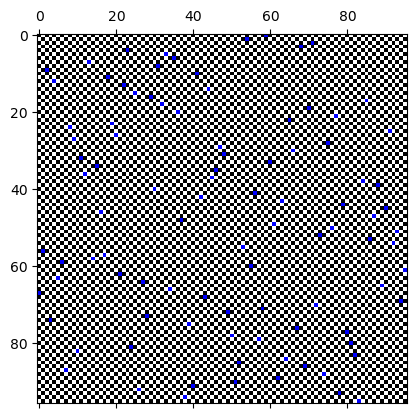

In [35]:
# The n-queens problem consists on placing n queens in an nxn chessboard without killing each other

# Set the problem as a QUBO:
# Solution: a sequence of squares that represents the board with queens in it
# Binary variables: indicate whether a square has a queen (1) or not (0)
# Objective function: maximize the number of queens placed
# Constraints: only one queen per row, per column and per diagonal

# Create a class of the chessboard


class Chessboard:
    # Take input boardsize
    def __init__(self, boardsize):
        self.boardsize = boardsize

        # Create a matrix of size nxn, the board itself
        self.boardarray = np.array([[0]*self.boardsize]*self.boardsize)
        # Put alternating 0s and 1s, which will correspond to the colours of the chessboard in its plot
        for row in range(0, len(self.boardarray)):
            for col in range(row % 2, len(self.boardarray), 2):
                self.boardarray[row][col] = 1

        # Put name of the squares in the board as "cmrn", m being the column number and n being the row number
        self.numbered_board = numbered_board = []
        for row in range(0, len(self.boardarray)):
            for col in range(0, len(self.boardarray)):
                numbered_board.append("c{}r{}".format(col, row))

        # Divide the board in rows, creating a list with nested lists for each row
        self.numbered_rows = numbered_rows = []
        for row in range(0, self.boardsize):
            numbered_rows.append(
                self.numbered_board[self.boardsize*row:((row+1)*self.boardsize)])

        # Divide the board in columns, creating a list with nested lists for each column
        self.numbered_cols = numbered_cols = []
        for col in range(0, self.boardsize):
            sq = col
            numbered_cols.append([])
            while sq <= len(self.numbered_board)-1:
                numbered_cols[col].append(self.numbered_board[sq])
                sq += self.boardsize

        # Divide the board in diagonals, creating a list with nested lists for each diagonal
        self.numbered_diags = numbered_diags = []
        # Convert board list into an array
        numbered_array = np.array(self.numbered_rows)
        # Add the diagonals, i.e. [[c0r1,c1r2],[c0r0,c1r1,c2r2],[c1r0,c2r1]]
        for diag in range(-len(numbered_array)+2, len(numbered_array)-1):
            numbered_diags.append(list(numbered_array.diagonal(diag)))
        # Add the antidiagonals, i.e. [[c0r1,c1r0],[c0r2,c1r1,c2r0],[c1r2,c2r1]]
        for antidiag in range(-len(numbered_array)+2, len(numbered_array)-1):
            numbered_diags.append(
                list(np.flipud(numbered_array).diagonal(antidiag)))

        self.placed_queens = []

    def get_square_list(self):
        square_list = []
        for row in self.numbered_board:
            square_list.append(row)
        return square_list

    # Represent where's a queen by putting a 2
    def set_queen(self, row, col):
        self.boardarray[row][col] = 2
        self.placed_queens.append("c{}r{}".format(col, row))

    def set_queens_by_name(self, squares):
        for i in range(0, len(squares)):
            square = squares.iloc[i]['square']
            row = int(square[square.find("r")+1:])
            col = int(square[1:square.find("r")])
            self.set_queen(row, col)

    def count_queens(self):
        count = 0
        for row in range(0, len(self.boardarray)):
            for col in range(0, len(self.boardarray)):
                if self.boardarray[row][col] == 2:
                    count += 1
        return count

    def get_col_row(self, square_name):
        row = int(square_name[square_name.find("r")+1:])
        col = int(square_name[1:square_name.find("r")])
        return col, row

    def is_in_same_row(self, square_name1, square_name2):
        col1, row1 = self.get_col_row(square_name1)
        col2, row2 = self.get_col_row(square_name2)
        return row1 == row2

    def is_in_same_col(self, square_name1, square_name2):
        col1, row1 = self.get_col_row(square_name1)
        col2, row2 = self.get_col_row(square_name2)
        return col1 == col2

    def is_in_same_diag(self, square_name1, square_name2):
        col1, row1 = self.get_col_row(square_name1)
        col2, row2 = self.get_col_row(square_name2)
        return np.abs(row1-row2) == np.abs(col1-col2)

    def count_dead_queens(self):
        count_dead = 0
        for i in range(0, len(self.placed_queens)):
            for j in range(i+1, len(self.placed_queens)):
                if self.is_in_same_col(self.placed_queens[i], self.placed_queens[j]) or self.is_in_same_row(self.placed_queens[i], self.placed_queens[j]) or self.is_in_same_diag(self.placed_queens[i], self.placed_queens[j]):
                    count_dead += 1
        return count_dead

    # Check if the solution obtained is valid
    def check_solution(self):
        filter_arr = self.boardarray > 1
        # Check that there's only 1 queen per diagonal
        for sq in range(-(len(self.boardarray))+2, len(self.boardarray)-1):
            if filter_arr.diagonal(sq).sum() > 1:
                return False
        for sq in range(-(len(self.boardarray))+2, len(self.boardarray)-1):
            if np.flipud(filter_arr).diagonal(sq).sum() > 1:
                return False
        # Count the non-zero elements
        queenspercol = np.count_nonzero(filter_arr, axis=0)
        queensperrow = np.count_nonzero(filter_arr, axis=1)
        # Check that there's only 1 queen per column
        invalid_cols = queenspercol > 1
        if invalid_cols.sum() > 0:
            return False
        # Check that there's only 1 queen per row
        invalid_rows = queensperrow > 1
        if invalid_rows.sum() > 0:
            return False
        return True

    def get_plot(self):
        # Plot the values of a 2D matrix or array as colour-coded image
        if len(self.placed_queens) == 0:
            cmap = ListedColormap(['w', 'k'])
        else:
            cmap = ListedColormap(['w', 'k', 'b'])  # white, black, blue
        fig, ax = plt.subplots()
        ax.matshow(self.boardarray, cmap=cmap)
        return plt


def coefficients(board):
    linear = {}
    quadratic = {}

    # Add linear coefficients to all the squares in the board
    for sq in range(0, len(board.numbered_board)):
        linear[board.numbered_board[sq]] = -1

    # Add quadratic coefficients to the pairs of squares in the same row
    for row in range(0, len(board.numbered_rows)):
        for rowpair in list(combinations(board.numbered_rows[row], 2)):
            quadratic[rowpair] = 2
    # Add quadratic coefficients to the pairs of squares in the same column
    for col in range(0, len(board.numbered_cols)):
        for colpair in list(combinations(board.numbered_cols[col], 2)):
            quadratic[colpair] = 2
    # Add quadratic coefficients to the pairs of squares in the same diagonal
    for diag in range(0, len(board.numbered_diags)):
        for diagpair in list(combinations(board.numbered_diags[diag], 2)):
            quadratic[diagpair] = 2

    return linear, quadratic

# Lowest energy solution, where there's 1 queen per row and 1 per column
def choosevar(linear, quadratic, board):
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0, 'BINARY')
    sampler = neal.SimulatedAnnealingSampler()
    # 100 samples gets several valid solutions
    num_iter = int(100)
    sampleset = sampler.sample(bqm, num_reads=num_iter)
    sampleset_iterator = sampleset.samples(num_iter)
    print(sampleset)

    # From the samples obtained, check if the solution is valid and plot it in a board
    for sample in sampleset_iterator:
        for el in sample:
            if sample.get(el) == 1:
                row = int(el[el.find("r")+1:])
                col = int(el[1:el.find("r")])
                board.set_queen(row, col)
        if board.check_solution():
            return board.get_plot()

# Instance an object of the class
s = 96
b1 = Chessboard(s)
linear, quadratic = coefficients(b1)
choosevar(linear, quadratic, b1)

### 1.7 Job Reassignment Problem


Tenemos $J$ máquinas, personas... Los llamaremos *agentes*, que actualmente están desarrollando un trabajo concreto cada uno. Sin embargo, debido a circunstancias inesperadas, hay $I$ trabajos ahora mismo vacantes que no tienen un agente asociado. El objetivo encontrar los agentes que mejor encajan en los trabajos tanto vacantes como ocupados actualmente (en total $J + I = K$ trabajos), y moverlos de los ocupados a los vacantes si fuera necesario.

Definimos una lista de trabajos actualmente ocupados $[a_j]$ y una lista $[P_j^C]$ con sus prioridades asociadas. De igual forma, definimos $[v_i]$ y $[P_i^V]$ con los vacantes. También existe una matriz que la llamaremos $(A_{kj})$ de tamaño $K \times J$ en donde el elemento $a_{ij}$ representa la afinidad del trabajador $j$ (que no confundir con el trabajo que está ocupando actualmente) con el trabajo $i$ (sea de los inicialmente ocupados o de los vacantes).

Ahora podemos definir para cada par $(i,j)$ donde $i$ es un trabajo vacante y $j$ uno ocupado una puntuación $S_{ij}$:

$$
s_{ij} = c^P \Delta_{ij}^P + c^A \Delta_{ij}^A = c^P (P_i^V - P_j^C) + c^A (A_{ij}^V-A_{jj}^C)
$$

donde la primera resta es la ganancia/pérdida de prioridad y el segundo la ganancia/pérdida de afinidad. $c^P$ y $c^A$ son coeficientes que regulan estos términos. Lo que buscamos es maximizar estos términos (para que se sustituyan trabajos "malos" por otros "buenos").

Las variables de nuestro problema son $x_{ij}$, que si valen $1$ entonces se cambia el trabajo $j$ por el $i$. Entonces ya podemos definir nuestro Hamiltoniano a minimizar así:

$$
H = - \sum_{i} \sum_j \bigg[ c^P (P_i^V - P_j^C) + c^A(A_{ij}^V-A_{jj}^C) \bigg]x_{ij} + \lambda_1 \sum_i \bigg( \sum_j x_{ij}-0.5 \bigg)^2 + \lambda_2 \sum_j \bigg( \sum_i x_{ij}-0.5 \bigg)^2
$$

El primer término es la función a maximizar (pero el signo cambiado para minimizar) y los otros dos términos son restricciones, de forma que la primera restricción es para que cada trabajo $i$ sea realizado como mucho por un agente, y la segunda restricción es para que cada agente $j$ al final sólo haga un trabajo (poner números más bien elevados para los coeficientes $\lambda$ que se cumpla). El término $0.5$ es para que la suma de variables sea o $0$ o $1$.

El problema puede tener valores de prioridades y afinidades discretos o continuos, pero en ambos casos realizamos una división del problema en D subproblemas, resolviendo primero los subproblemas con trabajos vacantes con prioridades altas. En caso de tener valores discretos, es muy cómodo tener por ejemplo $D=5$ porque pueden ser como las valoraciones con 5 estrellitas. En cualquier caso, se pueden tener otras divisiones tanto en el caso continuo como en el discreto.

Además, en cada subproblema, antes de aplicar el algoritmo Simulated Annealing, reducimos la dimensionalidad de cada subproblema aplicando la lógica para eliminar posibles cambios que no tienen sentido por empeorar la situación en la que nos encontremos.

#### 1.7.1 Definición de Inputs

Definimos una función que crea los inputs a este problema: las listas de los trabajos ocupados y vacantes y sus respectivas prioridades y la matriz de afinidades (y otros objetos para que nos sea todo más cómodo).

In [44]:
# np.random.seed(7)
def inicialización(tipo, J, I, D, PC_j_user = None, PV_i_user = None, A_kj_user = None):

    # K: Nº de trabajos totales
    K = I + J

    # a_j: Lista tal que el agente j está asignado al trabajo a_j[j]
    a_j = list(range(J))

    # {P_j}^C: Lista con prioridades de los trabajos a_j

    # Inicialización aleatoria DISCRETA
    if tipo == "discreto":
        PC_j = [int(num) for num in np.random.randint(1, D+1, size = J)]

    # Inicialización aleatoria CONTINUA (como np.random.random devuelve nº en [0,1) y tiene que ser (0,1] )
    elif tipo == "continuo":
        PC_j = [1 - float(num) for num in np.random.random(J)]

    # Inicialización voluntaria
    else:
        PC_j = PC_j_user


    # v_i = lista con los I trabajos vacantes.
    v_i = list(range(J,K))


    # {P_V}^i: Prioridades de los v_i trabajos

    # Inicialización aleatoria DISCRETA
    if tipo == "discreto":
        PV_i = [int(num) for num in np.random.randint(1, D+1, size = I)]

    # Inicialización aleatoria CONTINUA (como np.random.random devuelve nº en [0,1) y tiene que ser (0,1]
    elif tipo == "continuo":
        PV_i = [1 - float(num) for num in np.random.random(I)]

    # Inicialización voluntaria
    else:
        PV_i = PV_i_user


    # A_kj = Afinidades entre cada agente j y cada trabajo k

    # Inicialización aleatoria DISCRETA
    if tipo == "discreto":
        A_kj = np.random.randint(1, D+1, size = (K, J))

    # Inicialización aleatoria CONTINUA
    elif tipo == "continuo":
        A_kj = 1 - np.random.random_sample((K, J))

    # Inicialización voluntaria
    else:
        A_kj = A_kj_user


    # En cualquier caso, vamos a crear un diccionario con todos los K = I + J trabajos y sus respectivas prioridades
    dict_trab_prior = dict(zip(a_j, PC_j)) | dict(zip(v_i, PV_i))
    print(dict_trab_prior)

    return K, a_j, PC_j, v_i, PV_i, A_kj, dict_trab_prior

# I: Nº de trabajos vacantes
# J: Nº de trabajos ocupados ( = Nº agentes)
I = 6
J = 6

# D: Nº de subdivisiones del problema
    # En caso discreto = prioridad máxima
D = 5

# cP, cA son los coeficientes de los pesos relativos de los términos de prioridad y afinidad del Hamiltoniano (B.3)
cP = 10
cA = 10

# Si queremos el problema "discreto", "continuo", o "personalizado"
tipo = "continuo"

# En caso de que el usuario quiera inicializar por sí mismo los valores
#PC_j_user = # RELLENAR LISTA
#PV_i_user = # RELLENAR LISTA
#A_kj_user = # RELLENAR NP.MATRIX

# K, a_j, PC_j, v_i, PV_i, A_kj, dict_trab_prior = inicialización(tipo, J, I, D)
# print("a_j: ",a_j)
# print("PC_j: ", PC_j)
# print("v_i: ", v_i)
# print("PV_i: ", PV_i)
# #print("A_kj: ", A_kj)
# print("dict_trab_prior: ", dict_trab_prior)

#### 1.7.2 Procedimiento

##### **1.7.2.A División de lista de trabajos vacantes $[v_i]$ en D sublistas**

En primer lugar, dividimos el conjunto de trabajos vacantes en sublistas según sus prioridades.

###### *Caso 1. Si las prioridades son continuas*
Creamos intervalos de longitud igual entre 0 y 1. Para ello se utiliza para $d = 0,..., D-1$

$$
1-\frac{d}{D} \ge P_i^V \ge 1-\frac{d + 1}{D}
$$

Atención, porque las prioridades más altas estarán en el grupo $1$, y las más bajas en el $D$ (porque iremos resolviendo los subproblemas en orden ascendente y queremos asignar primero los trabajos más importantes).

###### *Caso 2. Si las prioridades son discretas*
Simplemente las agrupamos por prioridad pero al revés (resolvemos primero las que más prioridad tienen pero que están en el primer grupo).

In [45]:
# Caso CONTINUO
def crear_dict_D_sublistas_continuo(D, dict_trab_prior, v_i):

    # Primero, creamos un diccionario donde alojaremos las D sublistas
    dict_D_sublistas = dict()

    # Calculamos los límites de las categorías, que son 1-0/D = 1, 1-1/D, 1-2/D ... 1-D/D = 0
    limites = [1-i/D for i in range(0,D+1)]

    # Para cada valor de 0 a D-1
    for d in range(0, D):

        # Cogemos el máximo y el mínimo
        tope_arriba = limites[d]
        tope_abajo = limites[d+1]

        # Creamos la sublista en el diccionario
        dict_D_sublistas[d + 1] = [item for item in v_i if tope_arriba >= dict_trab_prior[item] > tope_abajo]

    return limites, dict_D_sublistas

# Caso DISCRETO
def crear_dict_D_sublistas_discreto(D, dict_trab_prior, v_i):

    # Primero, creamos un diccionario donde alojaremos las D sublistas
    dict_D_sublistas = dict()

    # Para cada valor de 0 a D-1
    for d in range(0, D):

        #dict_D_sublistas[d+1] = [item for item in v_i if dict_trab_prior[item] == d + 1]
        dict_D_sublistas[d+1] = [item for item in v_i if dict_trab_prior[item] == D - d]
    return dict_D_sublistas

# Si las prioridades son CONTINUAS
# limites_sublistas, dict_D_sublistas = crear_dict_D_sublistas_continuo(D, dict_trab_prior, v_i)
# print(limites_sublistas, dict_D_sublistas)

# Si las prioridades son DISCRETAS
#dict_D_sublistas = crear_dict_D_sublistas_discreto(D, dict_trab_prior, v_i)
#print(dict_D_sublistas)

##### **1.7.2.B Iteraciones**

Para $\delta \in \{1,...,D\}$, repetir los siguientes pasos:

###### *B.1 Primer filtro*

Como sólo pueden ocurrir cambios tales que $\Delta_{ij}^P = P_i^V - P_j^C > 0$ (es decir, que la prioridad de los trabajos ocupados sea menor a las de las vacantes), podemos crear una sublista $[a_j]_\delta$ con trabajos ocupados por el momento tales que $p_j^C < p_{\delta}^Vmax$.

In [46]:
# CASO CONTINUO Y DISCRETO
# delta = 5
def filtro_prioridades(dict_D_sublistas, lista_a_j, dict_trab_prior, delta):

    # Primero, hallamos la prioridad más alta de aquellas relacionadas con la lista delta
    max_pV_delta = max([dict_trab_prior[vacante] for vacante in dict_D_sublistas[delta]])

    # Nos quedamos con aquellos trabajos actualmente ocupados tales que son menores a este valor
    return [trabajo_actual for trabajo_actual in lista_a_j if dict_trab_prior[trabajo_actual] < max_pV_delta]

# sublista_a_j = filtro_prioridades(dict_D_sublistas, a_j, dict_trab_prior, delta)
# print(sublista_a_j)

###### *B.2 Conectar elementos actuales con elementos vacantes*

Vamos a considerar todas aquellas posibles conexiones entre elementos de $[a_j]_\delta$ con elementos de $[v_i]_\delta$. Luego, quitaremos aquellas conexiones tales que $s_{ij} \leq 0 \rightarrow c^P \Delta_{ij}^P + c^A \Delta_{ij}^A \leq 0 \rightarrow c^P (P_i^V - P_j^C) + c^A (A_{ij}^V-A_{jj}^C) \leq 0$ (porque nos llevarían a una peor solución del problema; recordar que queremos maximizar los valores $s_{ij}$)

In [47]:
# Caso DISCRETO y CONTINUO
def crear_combinaciones(a_j, sublista_a_j, dict_D_sublistas, dict_trab_prior, A_kj, delta):

    # Primero, creamos la lista donde iremos alojando los pares
    lista_pares = []

    # Nos quedamos con la lista de v_i correspondiente
    lista_v_i = dict_D_sublistas[delta]

    # Para cada posible par ocupado - vacante
    for trabajo_a_j in sublista_a_j:
        for trabajo_v_i in lista_v_i:
            # Hacemos el cálculo de la expresión, y si es mayor que cero, lo añadimos a la lista
            primer_termino = dict_trab_prior[trabajo_v_i] - dict_trab_prior[trabajo_a_j]
            segundo_termino = A_kj[trabajo_v_i][a_j.index(trabajo_a_j)] - A_kj[trabajo_a_j][a_j.index(trabajo_a_j)]
            if cP * (primer_termino) + cA * (segundo_termino) > 0:
                lista_pares.append((trabajo_v_i, trabajo_a_j))

    return lista_pares

# combinaciones_delta = crear_combinaciones(a_j, sublista_a_j, dict_D_sublistas, dict_trab_prior, A_kj, delta)
# print(combinaciones_delta)

###### *B.3 Escribir los coeficientes de las variables*

Tenemos que describir los coeficientes de tanto los términos lineales como aquellos de los cuadráticos. Los lineales surgen porque $x_i^2 = x_i$.

El Hamiltoniano a resolver es el siguiente:

$$
H = - \sum_{i} \sum_j \bigg[ c^P (P_i^V - P_j^C) + c^A(A_{ij}^V-A_{jj}^C) \bigg]x_{ij} + \lambda_1 \sum_i \bigg( \sum_j x_{ij}-0.5 \bigg)^2 + \lambda_2 \sum_j \bigg( \sum_i x_{ij}-0.5 \bigg)^2
$$

El primer término ya está desarrollado, vamos con el segundo y el tercero.

- Segundo término:

$$
\lambda_1 \sum_i \bigg( \sum_j x_{ij}-0.5 \bigg)^2 = \lambda_1 \sum_i \bigg( \big( \sum_j x_{ij} \big)^2 +0.25 - \sum_{j} x_{ij}\bigg)
$$

Desarrollamos el término al cuadrado

$$
\big( \sum_j x_{ij} \big)^2 = \sum_j x_{ij}^2 +2\sum_{j<k}x_{ij}x_{ik} = \sum_j x_{ij} +2\sum_{j<k}x_{ij}x_{ik}
$$

Por lo que nos queda

$$
\lambda_1 \sum_i \bigg(\sum_j x_{ij} +2\sum_{j<k}x_{ij}x_{ik} +0.25 - \sum_{j} x_{ij}\bigg) = \lambda_1 \sum_i \bigg(2\sum_{j<k}x_{ij}x_{ik} +0.25 \bigg)
$$

- Tercer término:

$$
\lambda_2 \sum_j \bigg( \sum_i x_{ij}-0.5 \bigg)^2 = \lambda_2 \sum_j \bigg( \big( \sum_i x_{ij} \big)^2 +0.25 - \sum_{i} x_{ij}\bigg)
$$

Desarrollamos el término al cuadrado

$$
\big( \sum_i x_{ij} \big)^2 = \sum_i x_{ij}^2 +2\sum_{i<k}x_{ij}x_{kj} = \sum_i x_{ij} +2\sum_{i<k}x_{ij}x_{kj}
$$

Por lo que nos queda

$$
\lambda_2 \sum_j \bigg(\sum_i x_{ij} +2\sum_{i<k}x_{ij}x_{kj} +0.25 - \sum_{i} x_{ij}\bigg) = \lambda_2 \sum_j \bigg(2\sum_{i<k}x_{ij}x_{kj} +0.25 \bigg)
$$

 - Juntamos todos los términos:

$$
H = - \sum_{i} \sum_j \bigg[ c^P (P_i^V - P_j^C) + c^A(A_{ij}^V-A_{jj}^C) \bigg]x_{ij} + \lambda_1 \sum_i \bigg(2\sum_{j<k}x_{ij}x_{ik} +0.25 \bigg) + \lambda_2 \sum_j \bigg(2\sum_{i<k}x_{ij}x_{kj} +0.25 \bigg)
$$

Quitamos las constantes

$$
 = - \sum_{i} \sum_j \bigg[ c^P (P_i^V - P_j^C) + c^A(A_{ij}^V-A_{jj}^C) \bigg]x_{ij} + 2\lambda_1 \sum_i \bigg(\sum_{j<k}x_{ij}x_{ik}\bigg) + 2\lambda_2 \sum_j \bigg(\sum_{i<k}x_{ij}x_{kj}\bigg)
$$

In [48]:
def coefficients(pares, dict_trab_prior, cP, cA, A_kj, lambda1, lambda2):
    linear = {}
    quadratic = {}

    from collections import defaultdict
    indices_por_i = defaultdict(list)
    indices_por_j = defaultdict(list)

    for i, j in pares:
        indices_por_i[i].append(j)
        indices_por_j[j].append(i)

    # LINEALES
    for i, j in pares:
        P_V_i = dict_trab_prior[i]       # prioridad del trabajo vacante
        P_C_j = dict_trab_prior[j]       # prioridad del trabajo actualmente ocupado
        A_ij = A_kj[i][j]                   # afinidad del trabajador de j con el trabajo vacante i
        A_jj = A_kj[j][j]                   # afinidad del trabajador de j con su trabajo actual

        h_ij = - (cP * (P_V_i - P_C_j) + cA * (A_ij - A_jj))
        linear[f"x_{i}_{j}"] = h_ij

    # CUADRÁTICOS - restricción 1: cada vacante i asignada a lo sumo una vez
    for i in indices_por_i:
        js = sorted(indices_por_i[i])
        for idx1 in range(len(js)):
            for idx2 in range(idx1 + 1, len(js)):
                j1 = js[idx1]
                j2 = js[idx2]
                var1 = f"x_{i}_{j1}"
                var2 = f"x_{i}_{j2}"
                quadratic[(var1, var2)] = quadratic.get((var1, var2), 0.0) + 2 * lambda1

    # CUADRÁTICOS - restricción 2: cada trabajo ocupado j se reasigna a lo sumo una vez
    for j in indices_por_j:
        is_ = sorted(indices_por_j[j])
        for idx1 in range(len(is_)):
            for idx2 in range(idx1 + 1, len(is_)):
                i1 = is_[idx1]
                i2 = is_[idx2]
                var1 = f"x_{i1}_{j}"
                var2 = f"x_{i2}_{j}"
                quadratic[(var1, var2)] = quadratic.get((var1, var2), 0.0) + 2 * lambda2

    return linear, quadratic

def quantum_annealing(pares, dict_trab_prior, cP, cA, A_kj, lambda1, lambda2, num_iter=50):
    # Definimos los coeficientes
    linear, quadratic = coefficients(pares, dict_trab_prior, cP, cA, A_kj, lambda1, lambda2)
    # Creamos el Quantum Annealing y lo ejectuamos
    bqm = dimod.BinaryQuadraticModel(linear, quadratic, 0.0, dimod.BINARY)
    sampler = neal.SimulatedAnnealingSampler()
    sampleset = sampler.sample(bqm,
                              num_reads=num_iter,
                              beta_range=[0.1, 4.0],
                              num_sweeps=1000)

    # Nos quedamos con el mejor ejemplo
    best_sample = sampleset.first.sample

    # Aquí alojaremos los cambios
    resultado = []

    # Conseguimos la información que necesitamos
    for clave, valor in best_sample.items():
        if valor == 1:
            elementos = clave.split("_")
            resultado.append((int(elementos[1]), int(elementos[2])))

    return resultado

In [49]:
def filtrar_pares_sin_repetidos(pares):
    G = nx.Graph()
    G.add_edges_from(pares)

    # Encontrar el conjunto de pares máximo sin elementos repetidos
    matching = list(nx.max_weight_matching(G, maxcardinality=True))

    # Para asegurarnos que seguimos el orden
    resultado = []
    for tupla in matching:
        if tupla in resultado:
            resultado.append(tupla)
        else:
            resultado.append((tupla[1], tupla[0]))

    return resultado

In [50]:
def cambios_trabajos(lista_cambios, lista_a_j, lista_v_i, diccionario_trab_prior, lista_PC_j, lista_PV_i):
    # Para cada cambio
    for cambio in lista_cambios:
        # Nuevo, antiguo
        nuevo = cambio[0]
        antiguo = cambio[1]
        # Averiguamos el índice de cada uno en sus respectivas listas
        antiguo_index = lista_a_j.index(antiguo)
        nuevo_index = lista_v_i.index(nuevo)
        # Averiguamos las prioridades de cada uno
        antiguo_prior = diccionario_trab_prior[antiguo]
        nuevo_prior = diccionario_trab_prior[nuevo]
        # Actualizamos las listas
        lista_a_j[antiguo_index] = nuevo
        lista_PC_j[antiguo_index] = nuevo_prior

        lista_v_i[nuevo_index] = antiguo
        lista_PV_i[nuevo_index] = antiguo_prior

    return lista_a_j, lista_PC_j, lista_v_i, lista_PV_i

# a_j, PC_j, v_i, PV_i = cambios_trabajos(lista_cambios, prueba_a_j, prueba_v_i, dict_trab_prior, prueba_PC_j, prueba_PV_i)

In [51]:
# Caso DISCRETO
def actualizar_sublistas_discreto(lista_cambios, dict_trab_prior, dict_D_sublistas, delta):
    # Para cada cambio en la lista
    for cambio in lista_cambios:

        # Me quedo con el antiguo y su prioridad
        antiguo = cambio[1]
        antiguo_prior = dict_trab_prior[antiguo]

        # Vamos al diccionario de sublistas, añadimos el trabajo a la sublista asociada a la prioridad
        dict_D_sublistas[antiguo_prior].append(antiguo)

    return dict_D_sublistas

# Caso CONTINUO
def actualizar_sublistas_continuo(lista_cambios, dict_trab_prior, limites_sublistas, dict_D_sublistas, delta):
    # Para cada cambio en la lista
    for cambio in lista_cambios:

        # Me quedo con el antiguo y su prioridad
        antiguo = cambio[1]
        antiguo_prior = dict_trab_prior[antiguo]

        # Miramos en qué intervalo está según limites_sublistas
        # Las claves del diccionario (aquí son etiquetas de intervalos) son 1,...,D
        intervalo = delta
        for d in range(delta - 1, D - 1):
            limite_inf = limites_sublistas[d+1]
            limite_sup = limites_sublistas[d]
            #print(intervalo, limite_sup, limite_inf)
            #print("inf < antiguo_prior -> ", limite_inf," < ",antiguo_prior,": ",limite_inf < antiguo_prior)
            #print("antiguo_prior <= sup -> ", antiguo_prior," <= ",limite_sup,": ", antiguo_prior <= limite_sup)
            if limite_inf < antiguo_prior and antiguo_prior <= limite_sup:
                break
            intervalo += 1

        # Si el intervalo es que hemos hecho esta iteración, lo metemos en la siguiente
        if intervalo == delta:
            dict_D_sublistas[intervalo + 1].append(antiguo)

        # En otro caso
        else:
            dict_D_sublistas[intervalo].append(antiguo)

    return dict_D_sublistas

# Si es caso DISCRETO
# dict_D_sublistas = actualizar_sublistas_discreto(lista_cambios, dict_trab_prior, dict_D_sublistas, delta)

# Si es caso CONTINUO
# dict_D_sublistas = actualizar_sublistas_continuo(lista_cambios, dict_trab_prior, limites_sublistas, dict_D_sublistas, delta)

In [52]:
# INICIALIZACIÓN
np.random.seed(3)

# I: Nº de trabajos vacantes
# J: Nº de trabajos ocupados ( = Nº agentes)
I = 5
J = 5
# D: Nº de subdivisiones del problema
    # En caso discreto = prioridad máxima
D = 5

# cP, cA son los coeficientes de los pesos relativos de los términos de prioridad y afinidad del Hamiltoniano (B.3)
cP = 10
cA = 10

# Si queremos el problema "discreto", "continuo", o "personalizado"
    # SI ES PERSONALIZADO CAMBIAR DESPUÉS A CONTINUO/DISCRETO
tipo = "discreto"

# En caso de que el usuario quiera inicializar por sí mismo los valores
#PC_j_user = # RELLENAR LISTA
#PV_i_user = # RELLENAR LISTA
#A_kj_user = # RELLENAR NP.MATRIX

K, a_j, PC_j, v_i, PV_i, A_kj, dict_trab_prior = inicialización(tipo, J, I, D)
print("a_j: ",a_j)
print("PC_j: ", PC_j)
print("Suma de PC_j: ", sum(PC_j))
print("Suma de afinidades: ", sum([A_kj[p][p] for p in range(len(a_j))]))

asignacion_inicial = a_j.copy()
valor_inicial = sum(PC_j)
satisfaccion_inicial = sum([A_kj[p][p] for p in range(len(a_j))])

print("v_i: ", v_i)
print("PV_i: ", PV_i)
#print("A_kj: ", A_kj)
print("dict_trab_prior: ", dict_trab_prior)

# Si hemos hecho tipo = "personalizado", cambiar a "continuo" o "discreto"
#tipo = #RELLENAR
print("-------------------------------------------------------------------------------------------------")
# -------------------------------------------------------------------------------------------------------------------
# PASO A: CREACIÓN DE LAS D SUBLISTAS
print("A")
if tipo == "continuo":
    limites_sublistas, dict_D_sublistas = crear_dict_D_sublistas_continuo(D, dict_trab_prior, v_i)
else:
    dict_D_sublistas = crear_dict_D_sublistas_discreto(D, dict_trab_prior, v_i)
print("dict_D_sublistas: ", dict_D_sublistas)
# -------------------------------------------------------------------------------------------------------------------
# PASO B: ITERACIONES
# Definimos algunos parámetros para VQE
# Parámetros de las restricciones de
    # "Cada trabajo i se hace por un agente como mucho"
    # "Cada agente j como mucho reasignado a 1 trabajo"
lambda1 = 20
lambda2 = 20

# num_reads de Quantum_Annealing
lista_num_reads = [1, 10, 100, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 12500, 15000, 20000]

# Iteraciones
for delta in range(1, D+1):

    # Si hay algún elemento vacante en el grupo corresondiente
    if len(dict_D_sublistas[delta]) > 0:

        # B.1 Quitamos las que no tengan prioridades
        print(delta, " - B.1")
        sublista_a_j = filtro_prioridades(dict_D_sublistas, a_j, dict_trab_prior, delta)
        print("sublista_a_j: ",sublista_a_j)

        # B.2 Creamos las combinaciones pertinentes
        print(delta, " - B.2")
        combinaciones_delta = crear_combinaciones(a_j, sublista_a_j, dict_D_sublistas, dict_trab_prior, A_kj, delta)
        print("combinaciones_delta: ", combinaciones_delta)

        # Si hay más de 0 combinaciones (si no las hay, saltamos todo lo siguiente y vamos a la siguiente iteración):
        if len(combinaciones_delta) > 0:

            # Si hay exactamente una, ejecutamos ese cambio
            if len(combinaciones_delta) == 1:
                lista_cambios = combinaciones_delta

            # En otro caso, B.3 VQE
            else:
                print(delta, " - B.3")
                num_reads_value = lista_num_reads[min(len(combinaciones_delta), 16) - 1]
                lista_cambios = quantum_annealing(combinaciones_delta, dict_trab_prior, cP, cA, A_kj, lambda1, lambda2, num_iter=50)
                print("lista_cambios tras VQE:", lista_cambios)

                lista_cambios = filtrar_pares_sin_repetidos(lista_cambios)
                print("lista_cambios tras eliminar repetidos: ", lista_cambios)


            # Por si VQE sugiere no hacer cambios
            if len(lista_cambios) > 0:

                # B.4 Actualizar listas de ocupados y vacantes
                print(delta, " - B.4")
                a_j, PC_j, v_i, PV_i = cambios_trabajos(lista_cambios, a_j, v_i, dict_trab_prior, PC_j, PV_i)

                # B.5 Actualizamos las sublistas si no es la última iteración (ahorro computacional)
                if delta != D:
                    print(delta, " - B.5")
                    if tipo == "continuo":
                        dict_D_sublistas = actualizar_sublistas_continuo(lista_cambios, dict_trab_prior, limites_sublistas, dict_D_sublistas, delta)
                    else:
                        dict_D_sublistas = actualizar_sublistas_discreto(lista_cambios, dict_trab_prior, dict_D_sublistas, delta)


{0: 3, 1: 1, 2: 2, 3: 4, 4: 1, 5: 1, 6: 1, 7: 4, 8: 3, 9: 4}
a_j:  [0, 1, 2, 3, 4]
PC_j:  [3, 1, 2, 4, 1]
Suma de PC_j:  11
Suma de afinidades:  15
v_i:  [5, 6, 7, 8, 9]
PV_i:  [1, 1, 4, 3, 4]
dict_trab_prior:  {0: 3, 1: 1, 2: 2, 3: 4, 4: 1, 5: 1, 6: 1, 7: 4, 8: 3, 9: 4}
-------------------------------------------------------------------------------------------------
A
dict_D_sublistas:  {1: [], 2: [7, 9], 3: [8], 4: [], 5: [5, 6]}
2  - B.1
sublista_a_j:  [0, 1, 2, 4]
2  - B.2
combinaciones_delta:  [(9, 0), (7, 1), (9, 1), (7, 4)]
2  - B.3
lista_cambios tras VQE: [(7, 1), (9, 0)]
lista_cambios tras eliminar repetidos:  [(7, 1), (9, 0)]
2  - B.4
2  - B.5
3  - B.1
sublista_a_j:  [2, 4]
3  - B.2
combinaciones_delta:  [(8, 2), (8, 4), (0, 4)]
3  - B.3
lista_cambios tras VQE: [(0, 4), (8, 2)]
lista_cambios tras eliminar repetidos:  [(0, 4), (8, 2)]
3  - B.4
3  - B.5
5  - B.1
sublista_a_j:  []
5  - B.2
combinaciones_delta:  []


In [53]:
print("Asignación inicial de trabajos: ", asignacion_inicial)
print("Valor inicial de trabajos: ", valor_inicial)
print("Suma de afinidades: ", satisfaccion_inicial)
print("-----------------------------------------------------------------------------")
print("Asignación final de trabajos: ", a_j)
print("Valor final de trabajos: ", sum(PC_j))
print("Suma final de afinidades: ", sum([A_kj[a_j[p]][p] for p in range(len(a_j))]))

Asignación inicial de trabajos:  [0, 1, 2, 3, 4]
Valor inicial de trabajos:  11
Suma de afinidades:  15
-----------------------------------------------------------------------------
Asignación final de trabajos:  [9, 7, 8, 3, 0]
Valor final de trabajos:  18
Suma final de afinidades:  18


### Segunda librería que implementa Quantum Annealing

**NOTA:** No la he incluido en el yml porque me salía un problema con scipy de conflicto de librerías... Y como en un principio la anterior va bien

In [ ]:
if colab:
    !pip install openjij # Ojo con conflicto son scipy

In [ ]:
import openjij as oj

sampler = oj.SASampler()
response = sampler.sample_ising({'x': 0, 'y': 0}, {('x', 'y'): -1})

print(response)